In [1]:
import numpy as np
import scipy as sc
import matplotlib.pyplot as plt
from IPython.display import clear_output
from mpl_toolkits.axes_grid1.inset_locator import inset_axes,mark_inset
import time
import warnings
warnings.filterwarnings('ignore') 

In [2]:
def RK4(f, t_span, const, dt, x0):
    t = np.arange(t_span[0], t_span[1], dt)
    x_n = np.zeros((len(t), len(x0)), dtype=float)
    x_n[0] = x0
    
    for i in range(len(t)-1):
        k1 = dt * np.array(f(t[i], x_n[i], const))
        k2 = dt * np.array(f(t[i] + 0.5*dt, x_n[i] + 0.5*k1, const))
        k3 = dt * np.array(f(t[i] + 0.5*dt, x_n[i] + 0.5*k2, const))
        k4 = dt * np.array(f(t[i] + dt, x_n[i] + k3, const))
        x_n[i + 1] = x_n[i] + (k1 + 2*k2 + 2*k3 + k4) / 6
    return t, x_n

# $$\textbf{Duffing }$$

$\qquad \displaystyle \ddot{x}+\delta\dot{x}−x+x^3 = F\cos \left(\omega t\right) $                                                             

$\qquad \displaystyle \ddot{x} = F\cos \left(\omega t\right) - \delta\dot{x}+x-x^3$ 

In [3]:
dt = 0.01
w  = 1
F  = 0.4
b  = 0.25
T  = 5000000
x  = np.zeros(T)
v  = np.zeros(T)
t  = np.arange(0, T*dt, dt)
x[0] = 0.196
v[0] = 0.1

for n in range(T-1):
    a = F*np.cos(w*n*dt) - b*v[n] + x[n] - x[n]**3
    v[n+1] = v[n] + a*dt
    x[n+1] = x[n] + v[n]*dt

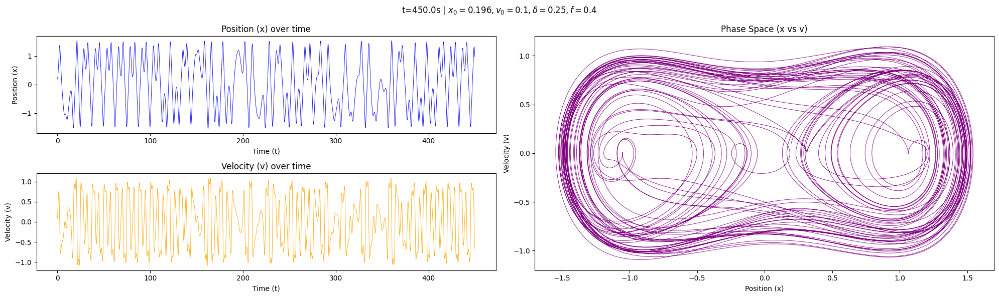

In [4]:
for n in range(46000):
    if n % 1000 == 0:
        clear_output(wait=True)
        fig = plt.figure(figsize=(20,6))
        gs=fig.add_gridspec(2,4)
        ax1=fig.add_subplot(gs[0,0:2])
        ax2=fig.add_subplot(gs[1,0:2])
        ax3=fig.add_subplot(gs[:,2:4])
        fig.suptitle(f't={n*dt}s | $x_0={x[0]}, v_0={v[0]}, \delta={b}, f={F}$')
        
        ax1.clear()
        ax1.plot(t[:n], x[:n], lw=0.6, color='blue')
        ax1.set_title("Position (x) over time")
        ax1.set_xlabel("Time (t)")
        ax1.set_ylabel("Position (x)")
                
        ax2.clear()
        ax2.plot(t[:n], v[:n], lw=0.6, color='orange')
        ax2.set_title("Velocity (v) over time")
        ax2.set_xlabel("Time (t)")
        ax2.set_ylabel("Velocity (v)")
        
        ax3.clear()
        ax3.plot(x[:n], v[:n], lw=0.6, color='purple')
        ax3.set_title("Phase Space (x vs v)")
        ax3.set_xlabel("Position (x)")
        ax3.set_ylabel("Velocity (v)")
        
        plt.tight_layout()
        plt.show()                                        

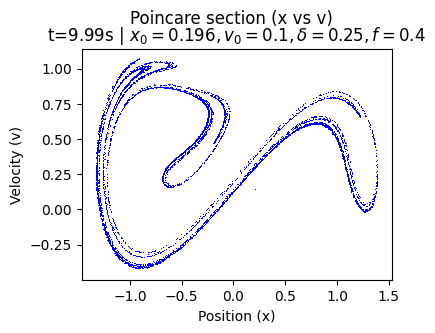

In [5]:
for n in range(1000):
    ts = abs((t + n/100 * 2*np.pi) % (2*np.pi)) < dt
    clear_output(wait=True)
    plt.figure(figsize=(4,3))
    plt.clf() 
    plt.plot(x[ts], v[ts], 'b,', lw=0.2)   
    plt.suptitle("Poincare section (x vs v)", y=1.01)
    plt.title(f't={n*dt:.2f}s | $x_0={x[0]}, v_0={v[0]}, \delta={b}, f={F}$')
    plt.xlabel("Position (x)")
    plt.ylabel("Velocity (v)")
    plt.show() 

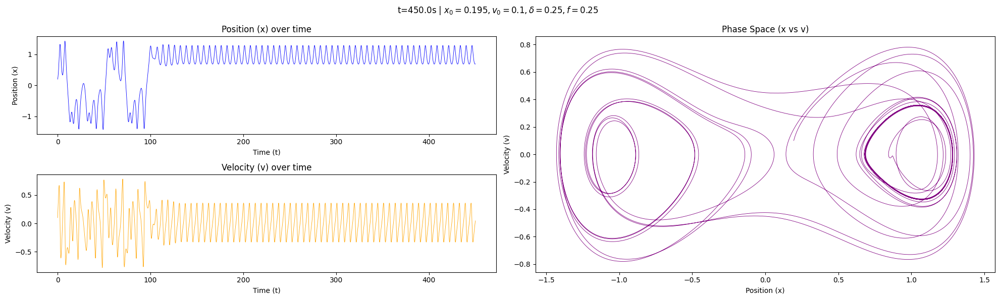

In [3]:
dt = 0.01
w = 1
F = 0.25
b = 0.25
T = 5000000
x = np.zeros(T)
v = np.zeros(T)
t = np.arange(0, T*dt, dt)
x[0] = 0.195
v[0] = 0.1

for n in range(T-1):
    a = F*np.cos(w*n*dt) - b*v[n] + x[n] - x[n]**3
    v[n+1] = v[n] + a*dt
    x[n+1] = x[n] + v[n]*dt
    
for n in range(46000):
    if n % 1000 == 0:
        clear_output(wait=True)
        fig = plt.figure(figsize=(20,6))
        gs=fig.add_gridspec(2,4)
        ax1=fig.add_subplot(gs[0,0:2])
        ax2=fig.add_subplot(gs[1,0:2])
        ax3=fig.add_subplot(gs[:,2:4])
        fig.suptitle(f't={n*dt}s | $x_0={x[0]}, v_0={v[0]}, \delta={b}, f={F}$')
        
        ax1.clear()
        ax1.plot(t[:n], x[:n], lw=0.6, color='blue')
        ax1.set_title("Position (x) over time")
        ax1.set_xlabel("Time (t)")
        ax1.set_ylabel("Position (x)")
                
        ax2.clear()
        ax2.plot(t[:n], v[:n], lw=0.6, color='orange')
        ax2.set_title("Velocity (v) over time")
        ax2.set_xlabel("Time (t)")
        ax2.set_ylabel("Velocity (v)")
        
        ax3.clear()
        ax3.plot(x[:n], v[:n], lw=0.6, color='purple')
        ax3.set_title("Phase Space (x vs v)")
        ax3.set_xlabel("Position (x)")
        ax3.set_ylabel("Velocity (v)")
        plt.tight_layout()
        plt.show()                                        

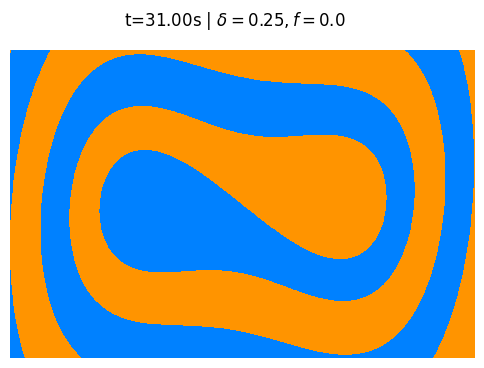

In [4]:
dt = 0.1
w  = 1
F  = 0.
b  = 0.25
T  = int( 5 * 2*np.pi/dt + 1)
xr = np.linspace(-2.5,2.5,1000)
yr = np.linspace(-2.5,2.5,1000)
x, v = np.meshgrid(xr, yr)

for n in range(T-1):
    a = F*np.cos(w*n*dt) - b*v + x - x**3
    v = v + a*dt
    x = x + v*dt
    if n%10 == 0:
        clear_output(wait=True)
        plt.figure(figsize=(6,4))
        plt.suptitle(f't={n*dt:.2f}s | $ \delta={b}, f={F}$')
        plt.contourf(x>0, level=[-2.5,0,2.5], cmap='jet')
        plt.axis(False)
        plt.show()

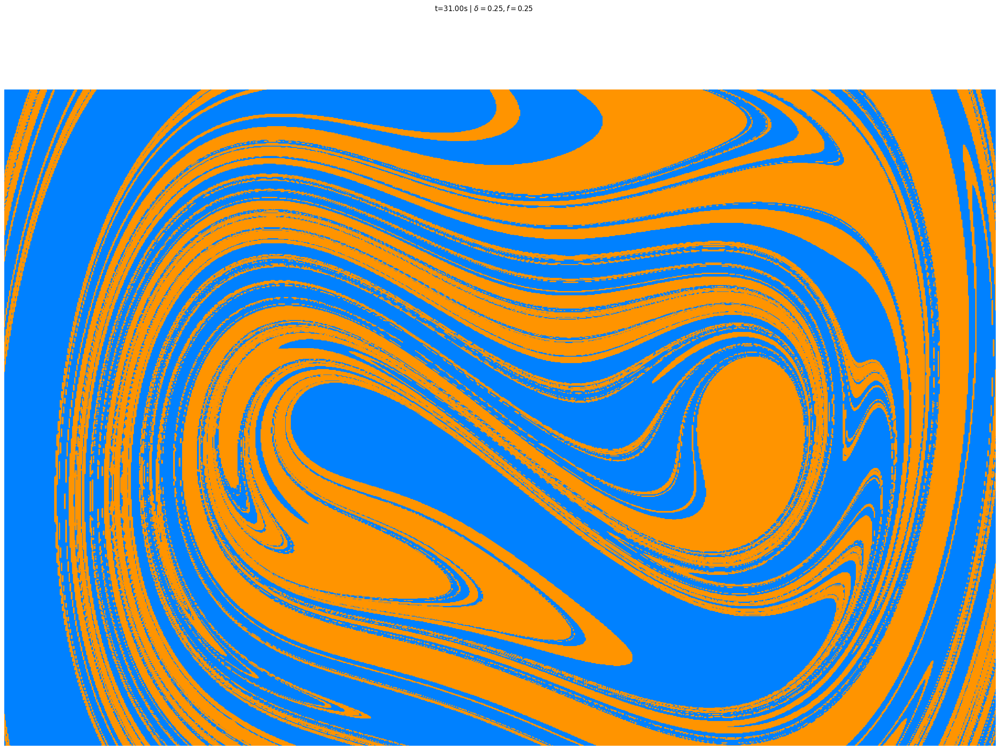

In [6]:
dt = 0.1
w  = 1
F  = 0.25
b  = 0.25
T  = int( 5 * 2*np.pi/dt + 1)
xr = np.linspace(-2.5,2.5,900)
yr = np.linspace(-2.5,2.5,900)
x, v = np.meshgrid(xr, yr)

for n in range(T-1):
    a = F*np.cos(w*n*dt) - b*v + x - x**3
    v = v + a*dt
    x = x + v*dt
    if n%10 == 0:
        clear_output(wait=True)
        plt.figure(figsize=(30,20))
        plt.suptitle(f't={n*dt:.2f}s | $ \delta={b}, f={F}$')
        plt.contourf(x>0, level=[-2.5,0,2.5], cmap="jet") 
        plt.axis(False)
        plt.show()

##  Duffing map
$ \qquad\begin{aligned} x_{n+1} &= y_n \\ y_{n+1} &= -bx_n + dy_n - y_n^3 , \\ d&\ge0, \ b>0. \end{aligned}$

In [6]:
def duffing_map(X0, const):
    x, y   = X0
    b, d   = const
    x_next = y
    y_next = -b * x + d * y - y**3
    return x_next, y_next

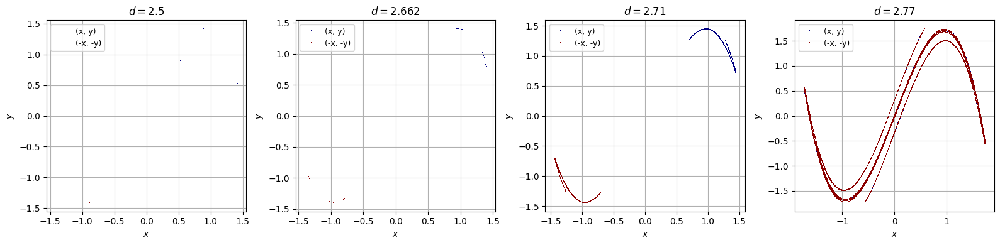

In [7]:
x0, y0 = 0.0001, 0.0003
b = 0.2
num_iter = 90000
discard = 1000  # discard transients
d_values = [2.5, 2.662, 2.71, 2.77]

plt.figure(figsize=(16,4))

for idx, d in enumerate(d_values):
    x, y = x0, y0
    x_vals, y_vals = [], []
    x_sym, y_sym = [], []

    for i in range(num_iter):
        x, y = duffing_map((x, y), (b, d))
        if i >= discard:
            x_vals.append(x)
            y_vals.append(y)
            x_sym.append(-x)
            y_sym.append(-y)

    ax = plt.subplot(1, 4, idx + 1)
    ax.plot(x_vals, y_vals, ',', markersize=5, color='navy', label='(x, y)')
    ax.plot(x_sym, y_sym, ',', markersize=5, color='darkred', label='(-x, -y)')
    ax.set_title(rf'$d={d}$' , fontsize=12)
    ax.set_xlabel('$x$')
    ax.set_ylabel('$y$')
    ax.grid(True)
    ax.legend(fontsize=9)    
plt.tight_layout()
plt.show()

### Duffing Map Bifurcation

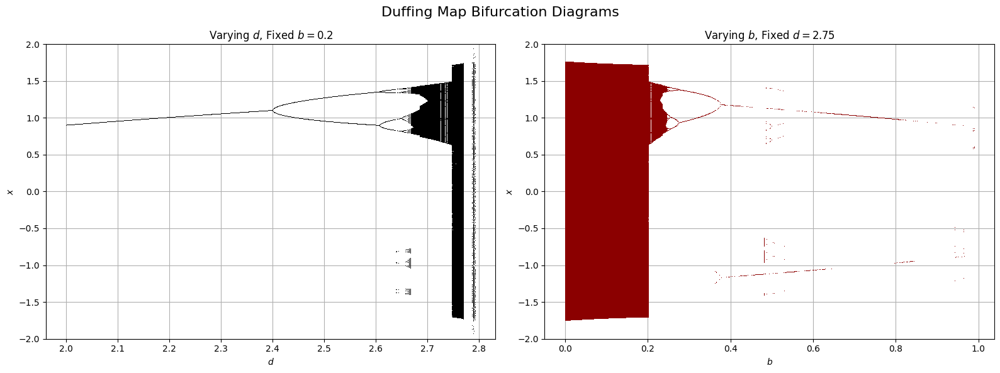

In [8]:
# Iteration settings
num_iter = 20000
discard = 1000
x0, y0 = 0.0001, 0.0001

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
fig.suptitle("Duffing Map Bifurcation Diagrams", fontsize=16)

d_vals = np.arange(2.0, 3.2, 0.001)
b_fixed = 0.2
x_vals_d, d_plot = [], []

for d in d_vals :
    x, y = x0, y0
    for i in range(num_iter):
        x, y = duffing_map((x, y), (b_fixed, d))
        if i > discard:
            x_vals_d.append(x)
            d_plot.append(d)

ax1.plot(d_plot, x_vals_d, ',', markersize=0.1, color='black')
ax1.set_title(rf'Varying $d$, Fixed $b = {b_fixed}$')
ax1.set_xlabel(r'$d$')
ax1.set_ylabel(r'$x$')
ax1.set_ylim(-2,2)
ax1.grid(True)

b_vals = np.arange(0.0, 1.0 + 0.01, 0.001)
d_fixed = 2.75
x_vals_b, b_plot = [], []

for b in  b_vals :
    x, y = x0, y0
    for i in range(num_iter):
        x, y = duffing_map((x, y), (b, d_fixed))
        if i > discard:
            x_vals_b.append(x)
            b_plot.append(b)

ax2.plot(b_plot, x_vals_b, ',', markersize=0.1, color='darkred')
ax2.set_title(rf'Varying $b$, Fixed $d = {d_fixed}$')
ax2.set_xlabel(r'$b$')
ax2.set_ylabel(r'$x$')
ax2.set_ylim(-2,2)
ax2.grid(True)

plt.tight_layout()
plt.subplots_adjust(top=0.88)
plt.show()

$\qquad \displaystyle \ddot{x}+\delta\dot{x}−x+x^3 = F\cos \left(\omega t\right) $                                                             

$\qquad \displaystyle \ddot{x} = F\cos \left(\omega t\right) - \delta\dot{x}+x-x^3$ 

In [3]:
def duffing(t, y, const):
    f, d, w = const   
    x, v = y          
    dxdt = v
    dvdt = f * np.cos(w * t) - d * v + x - x**3
    return np.array([dxdt, dvdt])

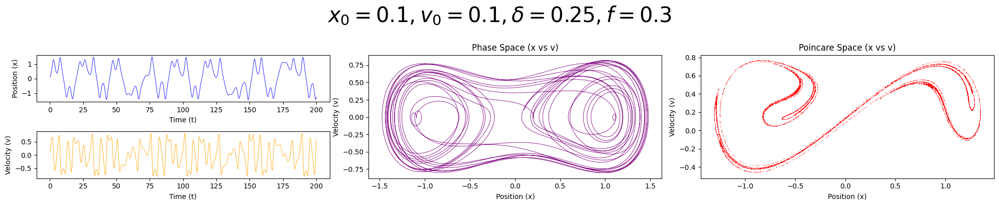

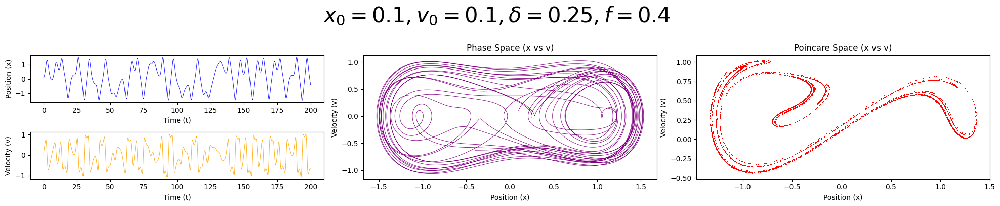

In [4]:
w  = 1
d  = 0.25
v0 = 0.1
x0 = 0.1
dt = 0.01
T  = 8000000
period = 2*np.pi/w

for f in [0.3, 0.4]:
    t, sol = RK4( duffing, [0, T*dt], (f, d, w), dt, [x0, v0] )
    x, v = sol[:,0], sol[:,1]
    ts = np.abs((t % period) - period ) < dt 

    fig = plt.figure(figsize=(20,4))
    gs=fig.add_gridspec(2,3)
    ax1=fig.add_subplot(gs[0,0])
    ax2=fig.add_subplot(gs[1,0])
    ax3=fig.add_subplot(gs[:,1])
    ax4=fig.add_subplot(gs[:,2])
    fig.suptitle(f'$x_0={x[0]}, v_0={v[0]}, \delta={d}, f={f}$', fontsize=30, y=1.01)
        
    ax1.plot(t[:20000], x[:20000], lw=0.6, color='blue')
    ax1.set_xlabel("Time (t)")
    ax1.set_ylabel("Position (x)")
                
    ax2.plot(t[:20000], v[:20000], lw=0.6, color='orange')
    ax2.set_xlabel("Time (t)")
    ax2.set_ylabel("Velocity (v)")
        
    ax3.plot(x[:20000], v[:20000], lw=0.6, color='purple')
    ax3.set_title("Phase Space (x vs v)")
    ax3.set_xlabel("Position (x)")
    ax3.set_ylabel("Velocity (v)")
    
    ax4.plot(x[ts], v[ts],'r,',ms=0.4)
    ax4.set_title("Poincare Space (x vs v)")
    ax4.set_xlabel("Position (x)") 
    ax4.set_ylabel("Velocity (v)")
    plt.tight_layout()
    plt.show()                                        

### Bifurction
#### Varying $F$ for fixed $\delta = 0.25, \omega=1.25$

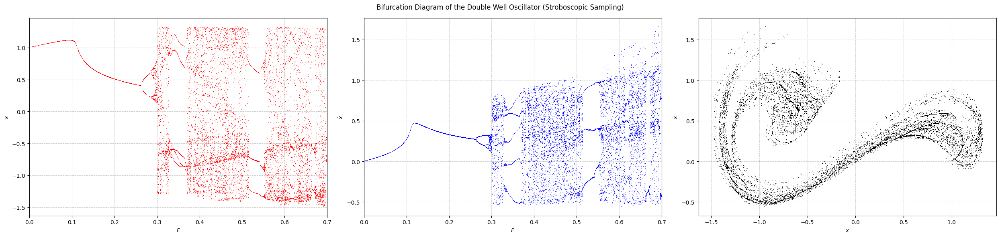

In [6]:
delta  = 0.25
omega  = 1.25
dt     = 0.01
T      = 2 * np.pi / omega
cycles_transient = 100
cycles_sample    = 30
t_span = [0, (cycles_transient + cycles_sample) * T]
t_all = np.arange(t_span[0], t_span[1], dt)
sample_times = np.array([T * (cycles_transient + i) for i in range(cycles_sample)])
sample_indices = [np.argmin(np.abs(t_all - ts)) for ts in sample_times]
x_samples, v_samples = [], []

initial_state = [0.0, 0.0]
for F in np.linspace(0., 0.7, 1000):
    params = (F, delta, omega)
    t, sol = RK4(duffing, t_span, params, dt, initial_state)
    x, v = sol[:, 0], sol[:, 1]
    x_s = x[sample_indices]
    v_s = v[sample_indices]
    x_samples.extend([[F, val] for val in x_s])
    v_samples.extend([[F, val] for val in v_s])
    initial_state = [sol[-1, 0], sol[-1, 1]]

x_bif = np.array(x_samples)
v_bif = np.array(v_samples)

fig, ax = plt.subplots(1, 3, figsize=(25, 6))
fig.suptitle('Bifurcation Diagram of the Double Well Oscillator (Stroboscopic Sampling)')
ax[0].plot(x_bif[:, 0], x_bif[:, 1], 'r,', ms=0.6)
ax[0].set_xlabel(r'$F$')
ax[0].set_ylabel(r'$x$')
ax[0].grid(True, linestyle='--', alpha=0.6)
ax[0].set_xlim([x_bif[:, 0].min(), x_bif[:, 0].max()])
ax[1].plot(v_bif[:, 0], v_bif[:, 1], 'b,', ms=0.6)
ax[1].set_xlabel(r'$F$')
ax[1].set_ylabel(r'$\dot{x}$')
ax[1].grid(True, linestyle='--', alpha=0.6)
ax[1].set_xlim([x_bif[:, 0].min(), x_bif[:, 0].max()])
ax[2].plot(x_bif[:, 1], v_bif[:, 1], 'k,', ms=0.6)
ax[2].set_xlabel(r'$x$')
ax[2].set_ylabel(r'$\dot{x}$')
ax[2].grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

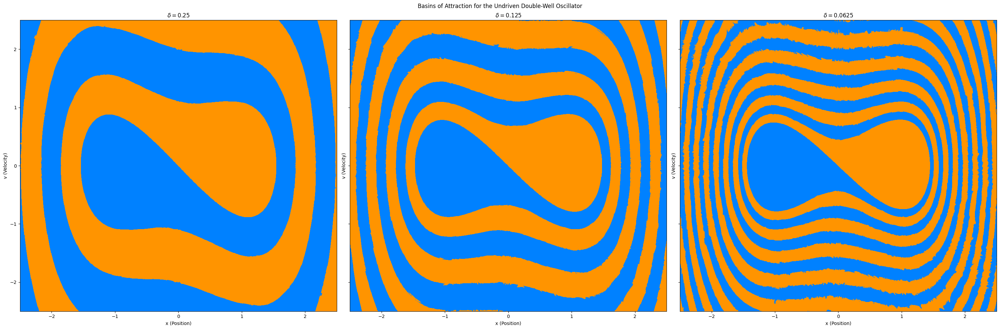

Total execution time: 9 hours, 39 minutes, and 45.3503 seconds


In [11]:
F      = 0.0         # Undriven
omega  = 1.0
T      = 2 * np.pi / omega
t_span = (0, 25*T)
t_eval = np.linspace(*t_span, 1000)
x_vals = np.linspace(-2.5, 2.5, 900)   
v_vals = np.linspace(-2.5, 2.5, 900)
X, V   = np.meshgrid(x_vals, v_vals)
init   = np.column_stack([X.ravel(), V.ravel()])
deltas = [0.25, 0.125, 0.0625]

start_time = time.time()
fig, axes = plt.subplots(1, len(deltas), figsize=(30, 10), sharex=True, sharey=True)

for ax, delta in zip(axes, deltas):
    basins = np.zeros_like(X)
    for i, y0 in enumerate(init):
        sol = sc.integrate.solve_ivp(duffing, t_span, y0, args=(delta, omega, F), method='RK45', t_eval=[t_span[1]])
        x_final = sol.y[0, -1]
        basins.ravel()[i] = -1 if x_final < 0 else 1
    ax.contourf(X, V, basins, levels=[-2.5, 0, 2.5], cmap='jet')
    ax.set_title(rf'$\delta = {delta}$')
    ax.set_xlabel('x (Position)')
    ax.set_ylabel('v (Velocity)')
plt.suptitle('Basins of Attraction for the Undriven Double-Well Oscillator')
plt.tight_layout()
plt.show()

end_time = time.time()
elapsed_time = end_time - start_time
hours = int(elapsed_time // 3600)
minutes = int((elapsed_time % 3600) // 60)
seconds = elapsed_time % 60
print(f"Total execution time: {hours} hours, {minutes} minutes, and {seconds:.4f} seconds")

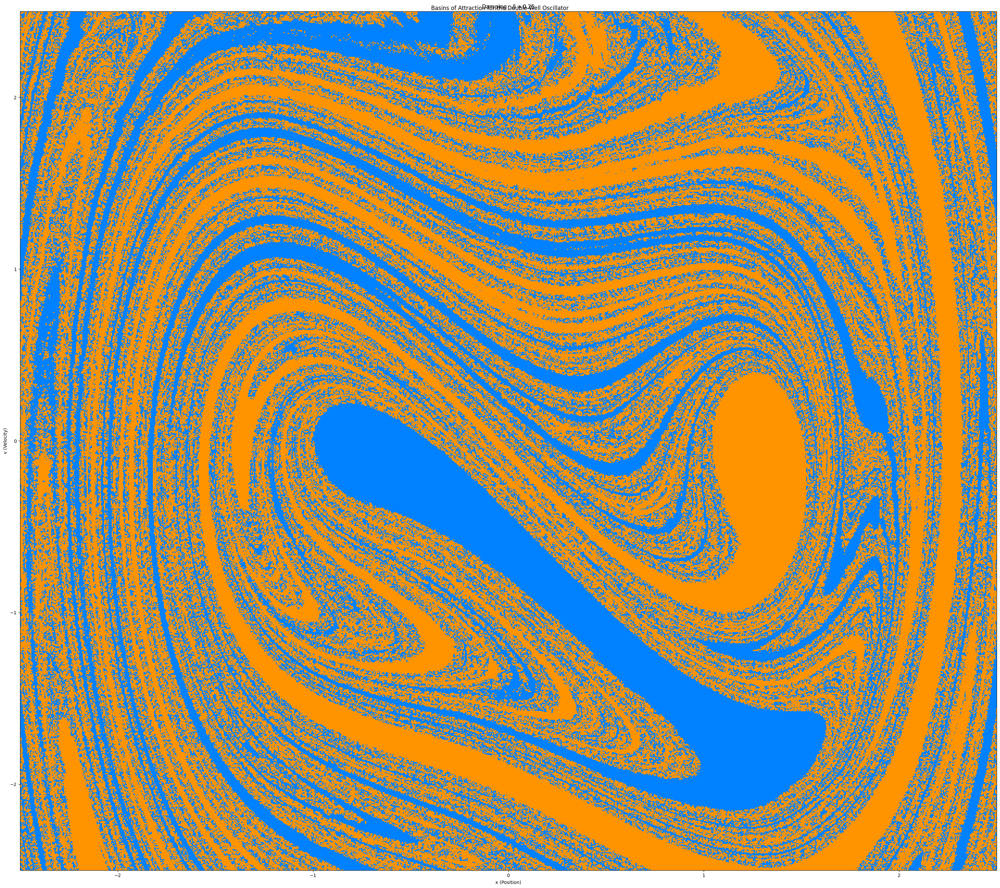

Total execution time: 11 hours, 48 minutes, and 16.0298 seconds


In [13]:
F      = 0.25
delta  = 0.25  
omega  = 1
T      = 2 * np.pi / omega
t_span = (0, 73*T)
t_eval = np.linspace(*t_span, 1000)
x_vals = np.linspace(-2.5, 2.5, 900)
v_vals = np.linspace(-2.5, 2.5, 900)
X, V   = np.meshgrid(x_vals, v_vals)
init   = np.column_stack([X.ravel(), V.ravel()])

fig, ax = plt.subplots(figsize=(30, 27), sharex=True, sharey=True)
start_time = time.time()
basins = np.zeros_like(X)

for i, y0 in enumerate(init):
    sol = sc.integrate.solve_ivp(duffing, t_span, y0, args=(delta, omega, F), method='RK45', t_eval=[t_span[1]])
    x_final = sol.y[0, -1]
    basins.ravel()[i] = -1 if x_final < 0 else 1

ax.contourf(X, V, basins, levels=[-2.5, 0, 2.5], cmap='jet')
ax.set_title(f'Damping : $\delta = {delta}$')
ax.set_xlabel('x (Position)')
ax.set_ylabel('v (Velocity)')
plt.suptitle('Basins of Attraction for the Double-Well Oscillator')
plt.tight_layout()
plt.show()

end_time = time.time()
elapsed_time = end_time - start_time
hours = int(elapsed_time // 3600)
minutes = int((elapsed_time % 3600) // 60)
seconds = elapsed_time % 60
print(f"Total execution time: {hours} hours, {minutes} minutes, and {seconds:.4f} seconds")

### Lyapunov

In [13]:
def fit(x,y):
    sx, sy, sx2, sxy = sum(x), sum(y), sum(x*x), sum(x*y)
    n = len(x)
    b = (n*sx2 - sx**2)
    m = (n*sxy - sx*sy) / b
    c = (sy*sx2 - sx*sxy) / b
    return m,c

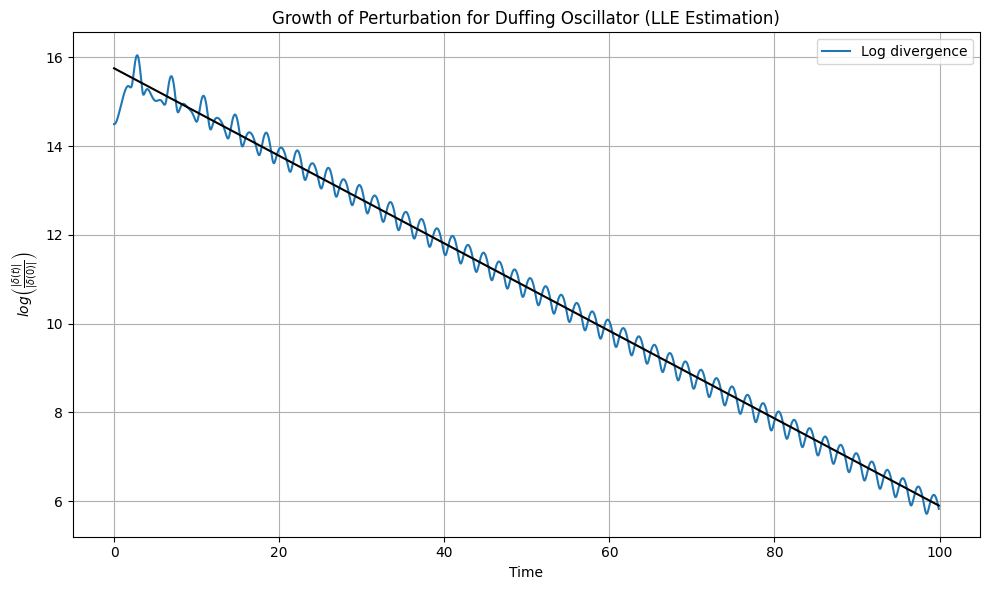

In [14]:
def lyapunov_exponent_duffing_track(f_func, t_span, x0, delta0, dt, params):
    delta_vec = np.array(delta0, dtype=float)
    norm_delta0 = np.linalg.norm(delta_vec)
    times = np.arange(t_span[0], t_span[1], dt)
    log_divergences = []
    x = np.array(x0, dtype=float)
    for _ in range(len(times) - 1):
        sol1 = sc.integrate.solve_ivp(f_func, [0, dt], x, args=(params,), method='RK45', rtol=1e-9) # Main trajectory
        x = sol1.y[:, -1]
        x_perturbed = x + delta_vec        # Perturbed trajectory
        sol2 = sc.integrate.solve_ivp(f_func, [0, dt], x_perturbed, args=(params,), method='RK45', rtol=1e-9)
        x_perturbed = sol2.y[:, -1]
        delta_vec = x_perturbed - x
        norm = np.linalg.norm(delta_vec)
        log_divergences.append(np.log(norm / norm_delta0))
        delta_vec *= norm_delta0 / norm    # Renormalize delta
    return times[:-1], log_divergences


params = (0.3, 0.2, 1.2)    # f, d, w
x0 = [0.1, 0.0]             # initial position, velocity
delta0 = [1e-8, 0.0]        # small perturbation
dt = 0.05
t_span = (0, 100)

times, log_divs = lyapunov_exponent_duffing_track(duffing, t_span, x0, delta0, dt, params)

x = times
y = log_divs
m,c = fit(x,y)
Y = m*x+c

plt.figure(figsize=(10, 6))
plt.plot(times, log_divs, label='Log divergence')
plt.plot(x, Y, 'k-')
plt.xlabel('Time')
plt.ylabel(r'$log\left(\frac{| \delta(t)| }{ | \delta(0)| }\right)$')
plt.title('Growth of Perturbation for Duffing Oscillator (LLE Estimation)')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

# $$\textbf{Ueda}$$

## $\qquad \ddot{x}+k\dot{x}+x^3=B\cos t$

In [15]:
def ueda(t, y, const):                        
    k, B = const             
    dx_dt = y[1]        
    dv_dt = -k*y[1] - y[0]**3 + B*np.cos(t)    
    return np.array([dx_dt, dv_dt])

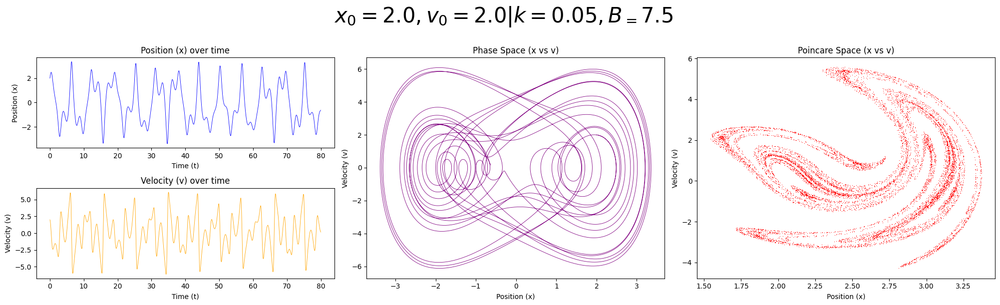

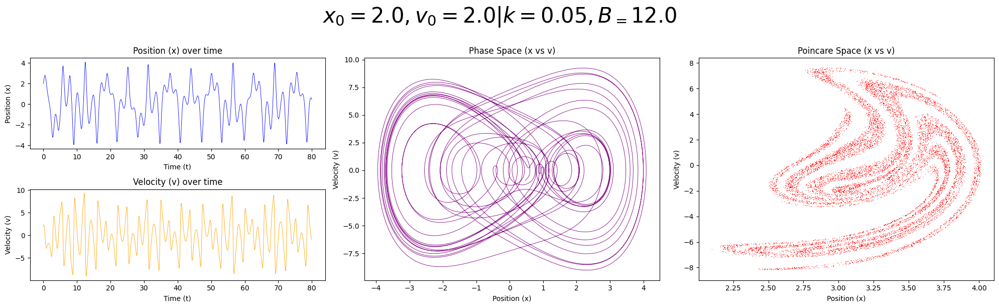

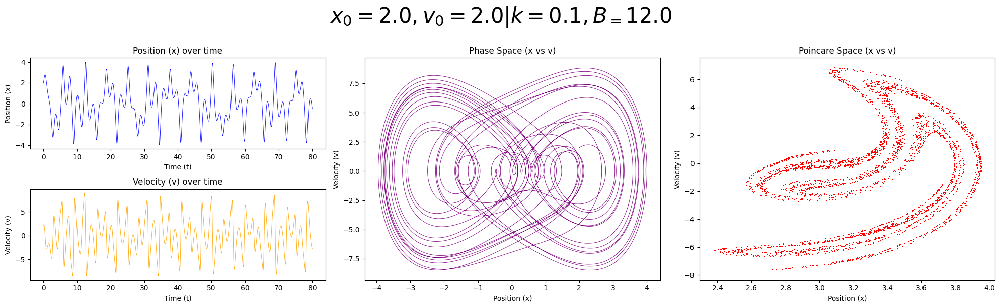

In [16]:
w = 0.1
x0 = [2,2]
dt = 0.01
t_max = 800000 
period = 2 * np.pi / w

for k,B in zip([0.05, 0.05, 0.1],[7.5, 12., 12.]):
    t, sol = RK4(ueda, [0, t_max], (k, B), dt, x0)
    x, v = sol[:, 0], sol[:, 1]
    ts = np.abs((t % period) - period ) < dt 

    fig = plt.figure(figsize=(20,6))
    gs=fig.add_gridspec(2,3)
    ax1=fig.add_subplot(gs[0,0])
    ax2=fig.add_subplot(gs[1,0])
    ax3=fig.add_subplot(gs[:,1])
    ax4=fig.add_subplot(gs[:,2])
    fig.suptitle(f'$x_0={x[0]}, v_0={v[0]} | k={k}, B_={B}$', fontsize=30, y=1.01)
        
    ax1.plot(t[:8000], x[:8000], lw=0.6, color='blue')
    ax1.set_title("Position (x) over time")
    ax1.set_xlabel("Time (t)")
    ax1.set_ylabel("Position (x)")
                
    ax2.plot(t[:8000], v[:8000], lw=0.6, color='orange')
    ax2.set_title("Velocity (v) over time")
    ax2.set_xlabel("Time (t)")
    ax2.set_ylabel("Velocity (v)")
        
    ax3.plot(x[:8000], v[:8000], lw=0.6, color='purple')
    ax3.set_title("Phase Space (x vs v)")
    ax3.set_xlabel("Position (x)")
    ax3.set_ylabel("Velocity (v)")
    
    ax4.plot(x[ts], v[ts], 'r,', lw=0.6)
    ax4.set_title("Poincare Space (x vs v)")
    ax4.set_xlabel("Position (x)")
    ax4.set_ylabel("Velocity (v)")
        
    plt.tight_layout()
plt.show()        

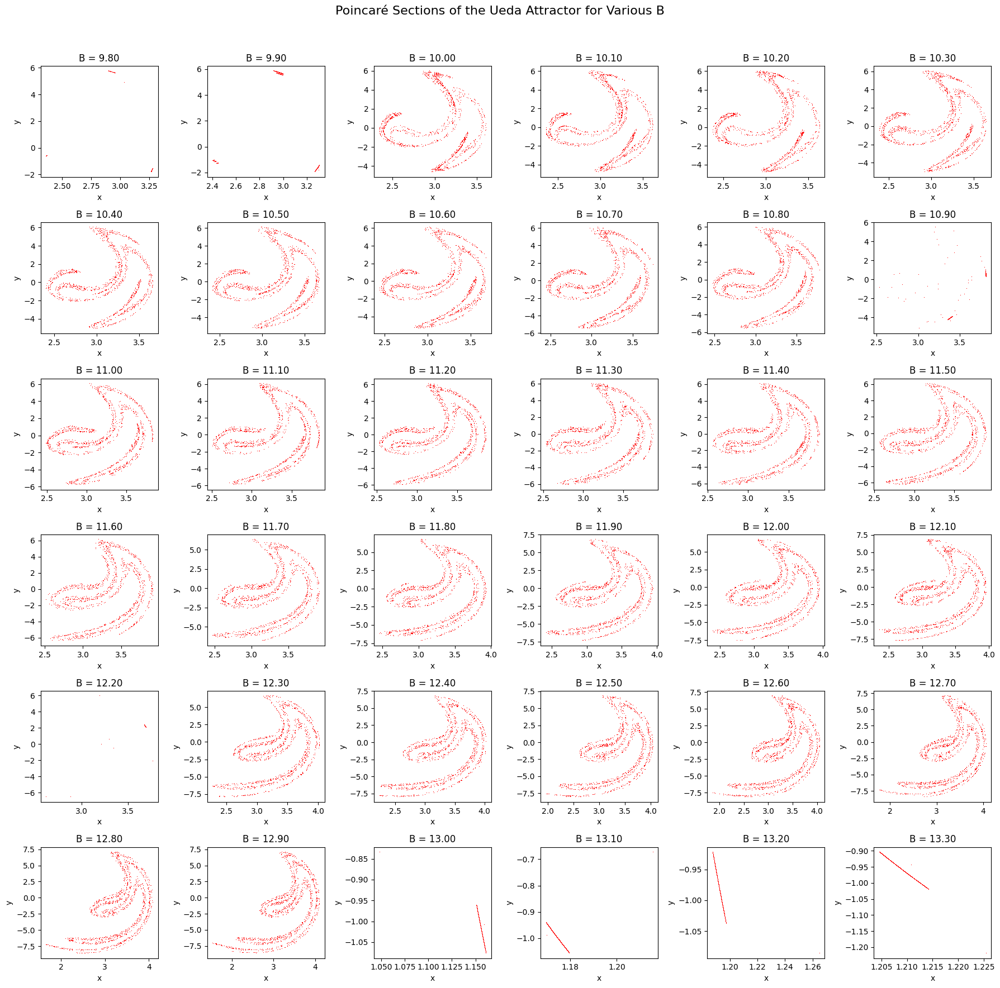

In [17]:
w = 0.1
k  = 0.1
x0 = [2., 2.]
dt = 0.01
t_span = (0, 80000)
period = 2 * np.pi / w
B_val  = np.arange(9.8, 13.4, 0.1)

fig, axs = plt.subplots(6,6, figsize=(18, 18))
axs = axs.flatten()

for idx, B in enumerate(B_val):
    t, sol = RK4(ueda, t_span, (k, B), dt, x0)
    x, v = sol[:, 0], sol[:, 1]
    ts = np.abs((t % period) - period ) < dt 
    
    axs[idx].plot(x[ts], v[ts], 'r,', lw=0.6)
    axs[idx].set_title(f"B = {B:.2f}")
    axs[idx].set_xlabel("x")
    axs[idx].set_ylabel("y")

plt.suptitle("Poincaré Sections of the Ueda Attractor for Various B", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

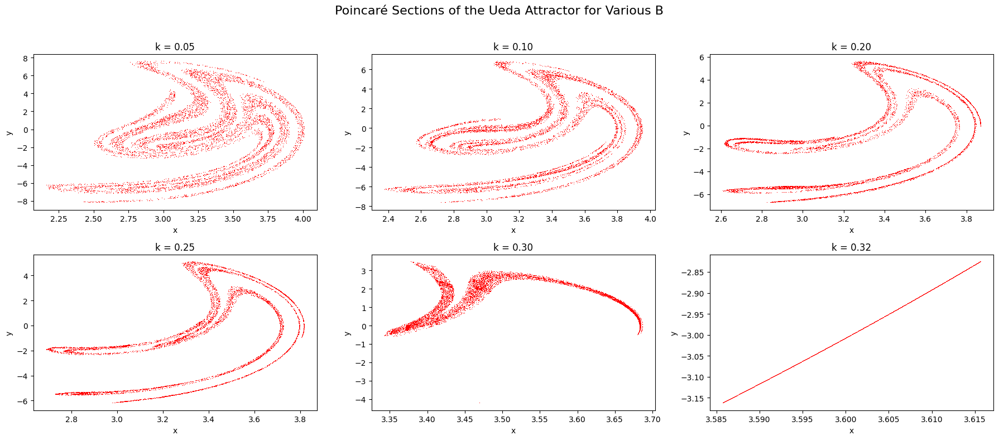

In [18]:
w  = 0.1
B  = 12
x0 = [2.0, 2.0]
dt = 0.01
t_span = (0, 500000)
period = 2 * np.pi / w
k_val  = [0.05, 0.1, 0.2, 0.25, 0.3, 0.32]

fig, axs = plt.subplots(2, 3, figsize=(18, 8))
axs = axs.flatten()

for idx, k in enumerate(k_val):
    t, sol = RK4(ueda, t_span, (k, B), dt, x0)
    x, v = sol[:, 0], sol[:, 1]
    ts = np.abs((t % period) - period ) < dt 
    #px, py = poincare_section(t, x)

    #axs[idx].plot(px, py, 'r,')
    axs[idx].plot(x[ts], v[ts], 'r,', lw=0.6)
    axs[idx].set_title(f"k = {k:.2f}")
    axs[idx].set_xlabel("x")
    axs[idx].set_ylabel("y")

plt.suptitle("Poincaré Sections of the Ueda Attractor for Various B", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

### Bifurcation

#### Varying B for fixed k = 0.1

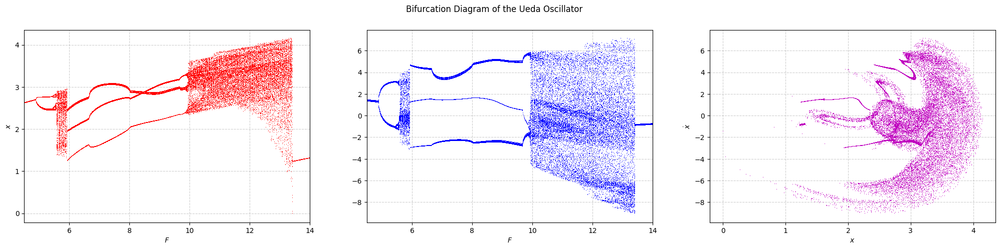

In [19]:
k      = 0.1           # Damping coefficient
dt     = 0.01          # Time step
omega  = 1
T      = 2 * np.pi / omega
cycles_transient = 100
cycles_sample    = 50
t_span = [0, (cycles_transient + cycles_sample) * T]
t_all = np.arange(t_span[0], t_span[1], dt)
sample_times = np.array([T * (cycles_transient + i) for i in range(cycles_sample)])
sample_indices = [np.argmin(np.abs(t_all - ts)) for ts in sample_times]

x_samples, v_samples = [], []

intit = [2., 2.]
for B in np.linspace(4.5, 14, 1000):
    params = (k, B)
    t, sol = RK4(ueda, t_span, params, dt, intit)
    x, v = sol[:, 0], sol[:, 1]
    x_sampled = x[sample_indices]
    v_sampled = v[sample_indices]
    x_samples.extend([[B, val] for val in x_sampled])
    v_samples.extend([[B, val] for val in v_sampled])
    intit = [sol[-1, 0], sol[-1, 1]]
x_bif = np.array(x_samples)
v_bif = np.array(v_samples)

fig, ax = plt.subplots(1, 3, figsize=(25, 5))
fig.suptitle('Bifurcation Diagram of the Ueda Oscillator')
ax[0].plot(x_bif[:, 0], x_bif[:, 1], 'r,', ms=0.6)
ax[0].set_xlabel(r'$F$')
ax[0].set_ylabel(r'$x$')
ax[0].grid(True, linestyle='--', alpha=0.6)
ax[0].set_xlim([x_bif[:, 0].min(), x_bif[:, 0].max()])
#ax[0].set_ylim([x_bif[:, 1].min(), x_bif[:, 1].max()])
ax[1].plot(v_bif[:, 0], v_bif[:, 1], 'b,', ms=0.6)
ax[1].set_xlabel(r'$F$')
#ax[1].set_ylabel(r'$\dot{x}$')
ax[1].grid(True, linestyle='--', alpha=0.6)
ax[1].set_xlim([v_bif[:, 0].min(), v_bif[:, 0].max()])
#ax[1].set_ylim([v_bif[:, 1].min(), v_bif[:, 1].max()])
ax[2].plot(x_bif[:, 1], v_bif[:, 1], 'm,')
ax[2].set_xlabel(r'$x$')
ax[2].set_ylabel(r'$\dot{x}$')
ax[2].grid(True, linestyle='--', alpha=0.6)
plt.show()

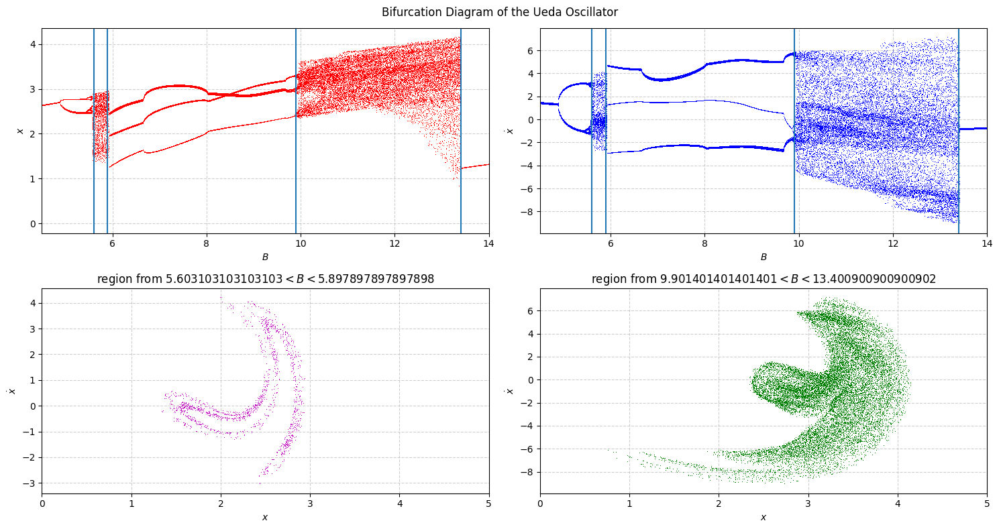

In [20]:
F_x, X = x_bif[:, 0], x_bif[:, 1]
F_v, V = v_bif[:, 0], v_bif[:, 1]
index1 = np.where(np.round(F_x,2)== 5.6)[0][0]  # F_x == F_v
index2 = np.where(np.round(F_x,2)== 5.9)[0][0]  
index3 = np.where(np.round(F_x,2)== 9.9)[0][0]  
index4 = np.where(np.round(F_x,2)==13.4)[0][0]

fig, ax = plt.subplots(2,2, figsize=(15, 8))
ax = ax.flatten()
fig.suptitle('Bifurcation Diagram of the Ueda Oscillator')
ax[0].plot(x_bif[:, 0], x_bif[:, 1], 'r,', ms=0.6)
ax[0].set_xlabel(r'$B$')
ax[0].set_ylabel(r'$x$')
ax[0].axvline(x=F_x[index1])
ax[0].axvline(x=F_x[index2])
ax[0].axvline(x=F_x[index3])
ax[0].axvline(x=F_x[index4])
ax[0].grid(True, linestyle='--', alpha=0.6)
ax[0].set_xlim([x_bif[:, 0].min(), x_bif[:, 0].max()])
#ax[0].set_ylim([x_bif[:, 1].min(), x_bif[:, 1].max()])
ax[1].plot(v_bif[:, 0], v_bif[:, 1], 'b,', ms=0.6)
ax[1].set_xlabel(r'$B$')
ax[1].set_ylabel(r'$\dot{x}$')
ax[1].axvline(x=F_v[index1])
ax[1].axvline(x=F_v[index2])
ax[1].axvline(x=F_v[index3])
ax[1].axvline(x=F_v[index4])
ax[1].grid(True, linestyle='--', alpha=0.6)
ax[1].set_xlim([v_bif[:, 0].min(), v_bif[:, 0].max()])
#ax[1].set_ylim([v_bif[:, 1].min(), v_bif[:, 1].max()])
ax[2].plot(X[index1:index2], V[index1:index2], 'm,')
ax[2].set_xlabel(r'$x$')
ax[2].set_ylabel(r'$\dot{x}$')
ax[2].set_title(rf'region from ${F_x[index1]} < B < {F_x[index2]}$')
ax[2].grid(True, linestyle='--', alpha=0.6)
ax[2].set_xlim([0, 5])
ax[3].plot(X[index3:index4], V[index3:index4], 'g,')
ax[3].set_xlabel(r'$x$')
ax[3].set_ylabel(r'$\dot{x}$')
ax[3].set_title(rf'region from ${F_x[index3]} < B < {F_x[index4]}$')
ax[3].grid(True, linestyle='--', alpha=0.6)
ax[3].set_xlim([0, 5])
plt.tight_layout()
plt.show()

#### Varying B for fixed k = 0.05

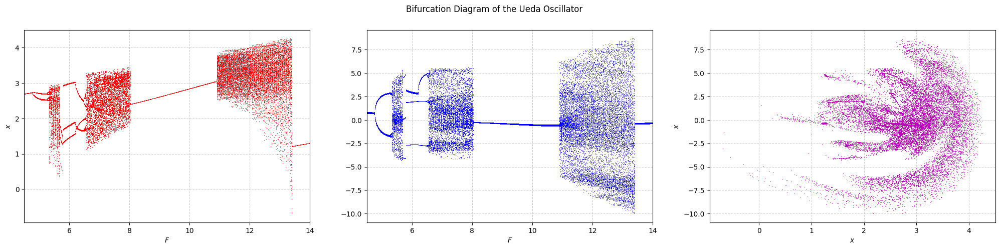

In [21]:
k      = 0.05           # Damping coefficient
dt     = 0.01          # Time step
omega  = 1
T      = 2 * np.pi / omega
cycles_transient = 100
cycles_sample    = 50
t_span = [0, (cycles_transient + cycles_sample) * T]
t_all = np.arange(t_span[0], t_span[1], dt)
sample_times = np.array([T * (cycles_transient + i) for i in range(cycles_sample)])
sample_indices = [np.argmin(np.abs(t_all - ts)) for ts in sample_times]

x_samples, v_samples = [], []

intit = [2., 2.]
for B in np.linspace(4.5, 14, 1000):
    params = (k, B)
    t, sol = RK4(ueda, t_span, params, dt, intit)
    x, v = sol[:, 0], sol[:, 1]
    x_sampled = x[sample_indices]
    v_sampled = v[sample_indices]
    x_samples.extend([[B, val] for val in x_sampled])
    v_samples.extend([[B, val] for val in v_sampled])
    intit = [sol[-1, 0], sol[-1, 1]]
x_bif = np.array(x_samples)
v_bif = np.array(v_samples)

fig, ax = plt.subplots(1, 3, figsize=(25, 5))
fig.suptitle('Bifurcation Diagram of the Ueda Oscillator')
ax[0].plot(x_bif[:, 0], x_bif[:, 1], 'r,', ms=0.6)
ax[0].set_xlabel(r'$F$')
ax[0].set_ylabel(r'$x$')
ax[0].grid(True, linestyle='--', alpha=0.6)
ax[0].set_xlim([x_bif[:, 0].min(), x_bif[:, 0].max()])
#ax[0].set_ylim([x_bif[:, 1].min(), x_bif[:, 1].max()])
ax[1].plot(v_bif[:, 0], v_bif[:, 1], 'b,', ms=0.6)
ax[1].set_xlabel(r'$F$')
#ax[1].set_ylabel(r'$\dot{x}$')
ax[1].grid(True, linestyle='--', alpha=0.6)
ax[1].set_xlim([v_bif[:, 0].min(), v_bif[:, 0].max()])
#ax[1].set_ylim([v_bif[:, 1].min(), v_bif[:, 1].max()])
ax[2].plot(x_bif[:, 1], v_bif[:, 1], 'm,')
ax[2].set_xlabel(r'$x$')
ax[2].set_ylabel(r'$\dot{x}$')
ax[2].grid(True, linestyle='--', alpha=0.6)
plt.show()

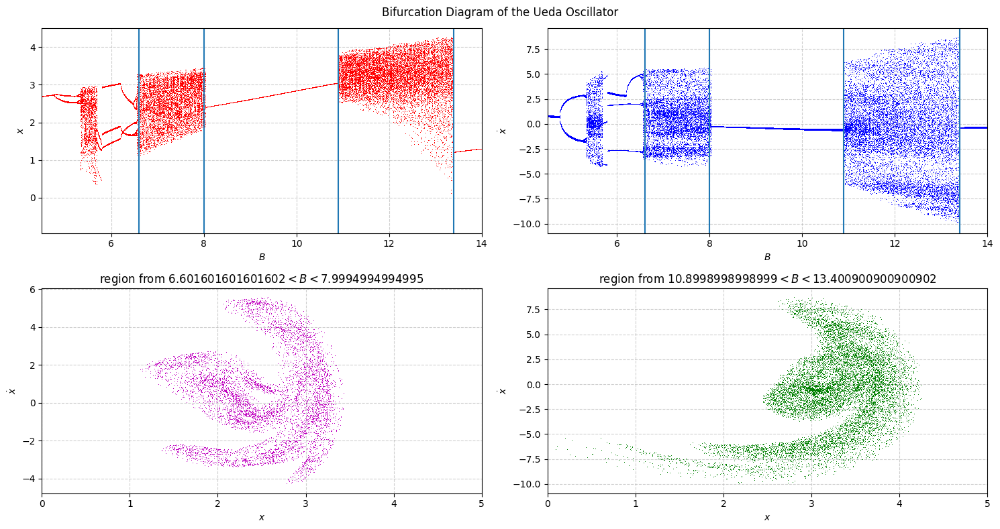

In [22]:
F_x, X = x_bif[:, 0], x_bif[:, 1]
F_v, V = v_bif[:, 0], v_bif[:, 1]
index1 = np.where(np.round(F_x,2)== 6.6)[0][0]  # F_x == F_v
index2 = np.where(np.round(F_x,2)== 8.0)[0][0]  
index3 = np.where(np.round(F_x,2)== 10.9)[0][0]  
index4 = np.where(np.round(F_x,2)==13.4)[0][0]

fig, ax = plt.subplots(2,2, figsize=(15, 8))
ax = ax.flatten()
fig.suptitle('Bifurcation Diagram of the Ueda Oscillator')
ax[0].plot(x_bif[:, 0], x_bif[:, 1], 'r,', ms=0.6)
ax[0].set_xlabel(r'$B$')
ax[0].set_ylabel(r'$x$')
ax[0].axvline(x=F_x[index1])
ax[0].axvline(x=F_x[index2])
ax[0].axvline(x=F_x[index3])
ax[0].axvline(x=F_x[index4])
ax[0].grid(True, linestyle='--', alpha=0.6)
ax[0].set_xlim([x_bif[:, 0].min(), x_bif[:, 0].max()])
#ax[0].set_ylim([x_bif[:, 1].min(), x_bif[:, 1].max()])
ax[1].plot(v_bif[:, 0], v_bif[:, 1], 'b,', ms=0.6)
ax[1].set_xlabel(r'$B$')
ax[1].set_ylabel(r'$\dot{x}$')
ax[1].axvline(x=F_v[index1])
ax[1].axvline(x=F_v[index2])
ax[1].axvline(x=F_v[index3])
ax[1].axvline(x=F_v[index4])
ax[1].grid(True, linestyle='--', alpha=0.6)
ax[1].set_xlim([v_bif[:, 0].min(), v_bif[:, 0].max()])
#ax[1].set_ylim([v_bif[:, 1].min(), v_bif[:, 1].max()])
ax[2].plot(X[index1:index2], V[index1:index2], 'm,')
ax[2].set_xlabel(r'$x$')
ax[2].set_ylabel(r'$\dot{x}$')
ax[2].set_title(rf'region from ${F_x[index1]} < B < {F_x[index2]}$')
ax[2].grid(True, linestyle='--', alpha=0.6)
ax[2].set_xlim([0, 5])
ax[3].plot(X[index3:index4], V[index3:index4], 'g,')
ax[3].set_xlabel(r'$x$')
ax[3].set_ylabel(r'$\dot{x}$')
ax[3].set_title(rf'region from ${F_x[index3]} < B < {F_x[index4]}$')
ax[3].grid(True, linestyle='--', alpha=0.6)
ax[3].set_xlim([0, 5])
plt.tight_layout()
plt.show()

#### Varying k for fixed B = 12

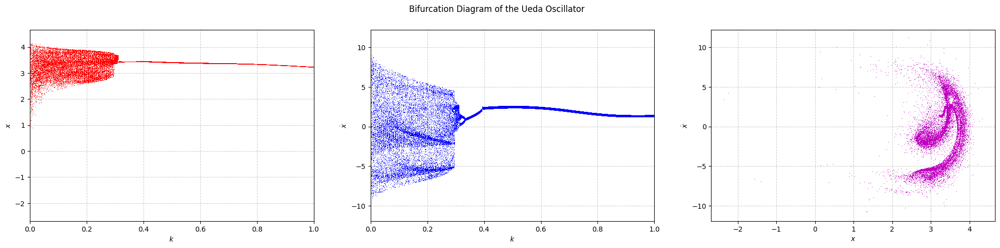

In [23]:
B      = 12
dt     = 0.01          # Time step
omega  = 1
T      = 2 * np.pi / omega
cycles_transient = 100
cycles_sample    = 50
t_span = [0, (cycles_transient + cycles_sample) * T]
t_all = np.arange(t_span[0], t_span[1], dt)
sample_times = np.array([T * (cycles_transient + i) for i in range(cycles_sample)])
sample_indices = [np.argmin(np.abs(t_all - ts)) for ts in sample_times]

x_samples, v_samples = [], []

intit = [2., 2.]
for k in np.linspace(0, 1, 1000):
    params = (k, B)
    t, sol = RK4(ueda, t_span, params, dt, intit)
    x, v = sol[:, 0], sol[:, 1]
    x_sampled = x[sample_indices]
    v_sampled = v[sample_indices]
    x_samples.extend([[k, val] for val in x_sampled])
    v_samples.extend([[k, val] for val in v_sampled])
    intit = [sol[-1, 0], sol[-1, 1]]
x_bif = np.array(x_samples)
v_bif = np.array(v_samples)

fig, ax = plt.subplots(1, 3, figsize=(25, 5))
fig.suptitle('Bifurcation Diagram of the Ueda Oscillator')
ax[0].plot(x_bif[:, 0], x_bif[:, 1], 'r,', ms=0.6)
ax[0].set_xlabel(r'$k$')
ax[0].set_ylabel(r'$x$')
ax[0].grid(True, linestyle='--', alpha=0.6)
ax[0].set_xlim([x_bif[:, 0].min(), x_bif[:, 0].max()])
#ax[0].set_ylim([x_bif[:, 1].min(), x_bif[:, 1].max()])
ax[1].plot(v_bif[:, 0], v_bif[:, 1], 'b,', ms=0.6)
ax[1].set_xlabel(r'$k$')
ax[1].set_ylabel(r'$\dot{x}$')
ax[1].grid(True, linestyle='--', alpha=0.6)
ax[1].set_xlim([v_bif[:, 0].min(), v_bif[:, 0].max()])
#ax[1].set_ylim([v_bif[:, 1].min(), v_bif[:, 1].max()])
ax[2].plot(x_bif[:, 1], v_bif[:, 1], 'm,')
ax[2].set_xlabel(r'$x$')
ax[2].set_ylabel(r'$\dot{x}$')
ax[2].grid(True, linestyle='--', alpha=0.6)
plt.show()

# $$\textbf{Ueda-Van der Pol attractor}$$

## $\ddot{x}-\mu(1-x^2)\dot{x}+x^3=B\cos\nu t $

In [17]:
def ueda_vanderpol(t, y, const):                         
    mu, nu, B = const             
    dx_dt = y[1]        
    dv_dt = mu * (1 - y[0]**2) * y[1] - y[0]**3 + B * np.cos(nu * t)    
    return np.array([dx_dt, dv_dt])

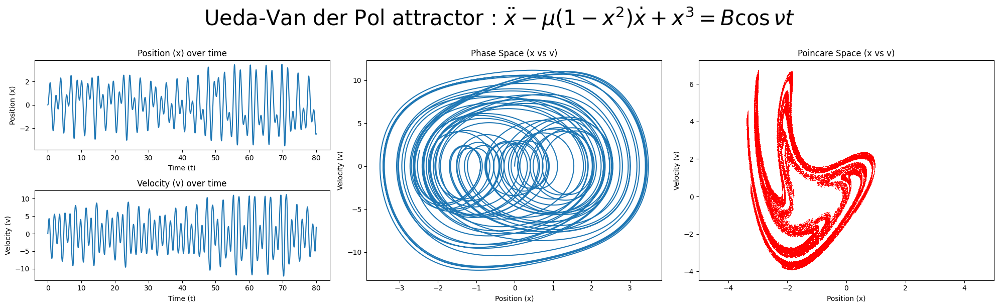

In [39]:
mu     = 0.2             # Damping coefficient
nu     = 4               # Forcing frequency
B      = 17              # Forcing amplitude
dt     = 0.01            # Time step
t_span = [0, 200000]     # Time span
x0     = [0.6e-6,0.6e-6]           # Initial conditions [position, velocity]
period = 2 * np.pi / nu

t, sol = RK4(ueda_vanderpol, t_span, (mu, nu, B), dt, x0)
x, v = sol[:, 0], sol[:, 1]
ts = np.abs((t % period) - period ) < dt 

fig = plt.figure(figsize=(20,6))
plt.suptitle('Ueda-Van der Pol attractor'+r' : $\ddot{x}-\mu(1-x^2)\dot{x}+x^3=B\cos\nu t $',y=1.01, fontsize=30)
gs = fig.add_gridspec(2, 3)
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[1, 0])
ax3 = fig.add_subplot(gs[:, 1])
ax4 = fig.add_subplot(gs[:, 2])

ax1.plot(t[:8000], x[:8000])
ax1.set_title("Position (x) over time")
ax1.set_xlabel("Time (t)")
ax1.set_ylabel("Position (x)")

ax2.plot(t[:8000], v[:8000])
ax2.set_title("Velocity (v) over time")
ax2.set_xlabel("Time (t)")
ax2.set_ylabel("Velocity (v)")

ax3.plot(x[:8000], v[:8000])
ax3.set_title("Phase Space (x vs v)")
ax3.set_xlabel("Position (x)")
ax3.set_ylabel("Velocity (v)")

ax4.plot(x[ts], v[ts],'r,',ms=0.4)
ax4.set_title("Poincare Space (x vs v)")
ax4.set_xlabel("Position (x)")
ax4.set_ylabel("Velocity (v)")
ax4.set_xlim([-10, 10])
ax4.set_xlim([-5, 5])

plt.tight_layout()
plt.show()

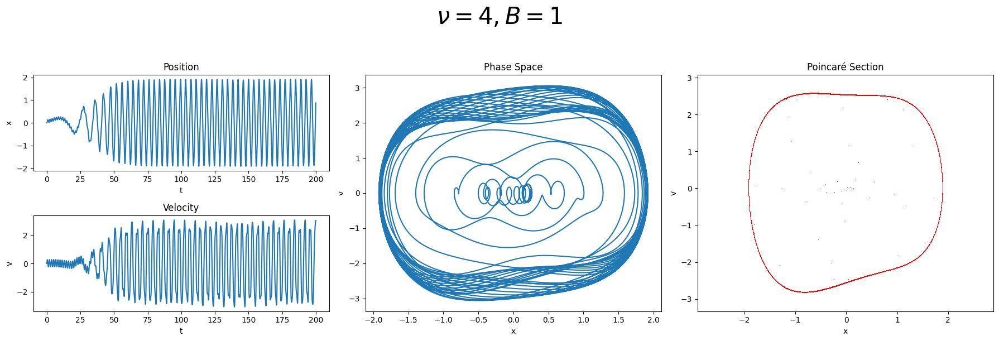

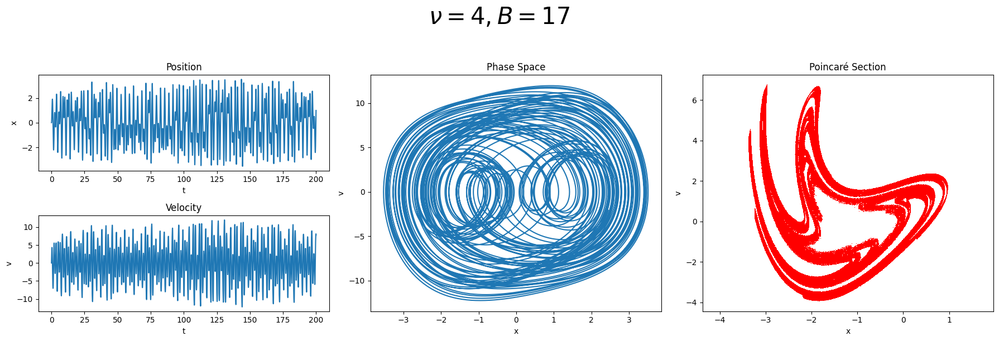

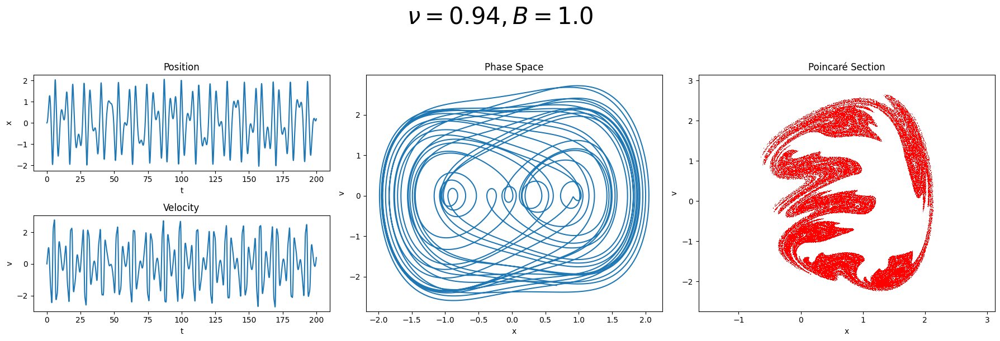

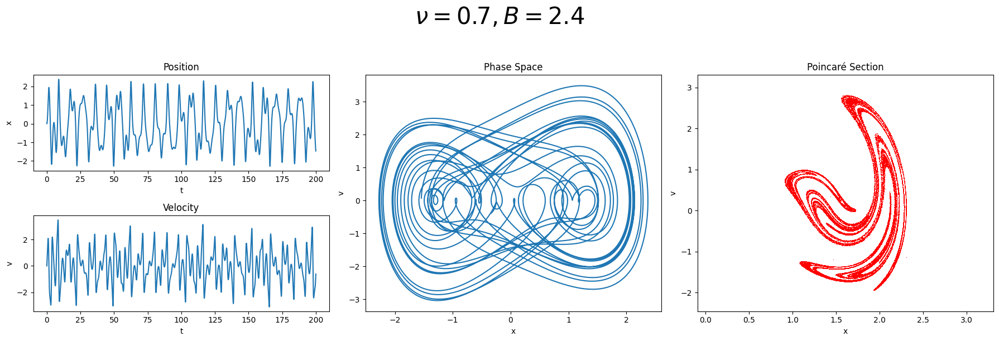

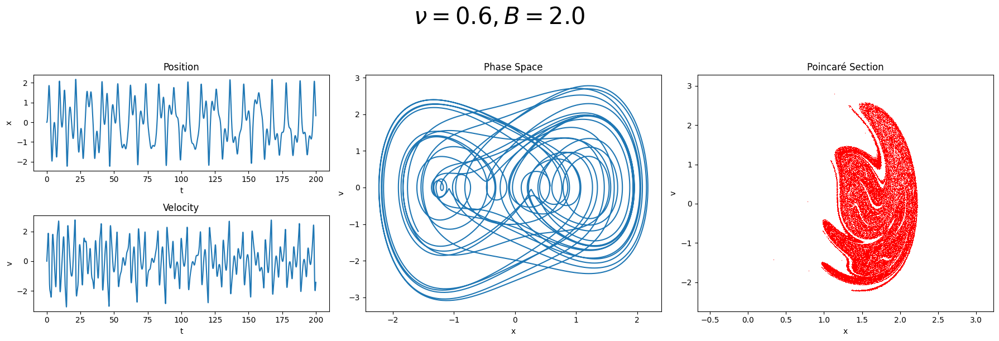

In [27]:
mu     = 0.2       # Damping coefficient
B_vals = [1, 17, 1.00, 2.4, 2.0]
k_vals = [4,  4, 0.94, 0.7, 0.6]
dt     = 0.01
t_span = [0, 800000]  # Shorter for plotting speed
x0     = [0, 0]

for idx, (B, k) in enumerate(zip(B_vals, k_vals)):
    t, sol = RK4(ueda_vanderpol, t_span, (mu, k, B), dt, x0)
    x, v = sol[:, 0], sol[:, 1]
    period = 2 * np.pi / k
    ts = np.abs((t % period) - period) < dt

    fig = plt.figure(figsize=(18,6))
    gs=fig.add_gridspec(2,3)
    ax1=fig.add_subplot(gs[0,0])
    ax2=fig.add_subplot(gs[1,0])
    ax3=fig.add_subplot(gs[:,1])
    ax4=fig.add_subplot(gs[:,2])
    fig.suptitle(rf'$ \nu={k}, B={B}$', fontsize=30, y=1.01)
        
    # Time series (x)
    ax1.plot(t[:int(200/dt)], x[:int(200/dt)])
    ax1.set_title(f"Position")
    ax1.set_xlabel("t")
    ax1.set_ylabel("x")

    # Time series (v)
    ax2.plot(t[:int(200/dt)], v[:int(200/dt)])
    ax2.set_title("Velocity")
    ax2.set_xlabel("t")
    ax2.set_ylabel("v")

    # Phase space
    ax3.plot(x[int(7/dt):int(150/dt)], v[int(7/dt):int(150/dt)])
    ax3.set_title("Phase Space")
    ax3.set_xlabel("x")
    ax3.set_ylabel("v")

    # Poincaré section
    ax4.plot(x[ts], v[ts], 'r,', ms=0.4)
    ax4.set_title("Poincaré Section")
    ax4.set_xlabel("x")
    ax4.set_ylabel("v")
    ax4.set_xlim([-1.0+np.min(x[ts]), np.max(x[ts])+1.0])
    ax4.set_ylim([-0.5+np.min(v[ts]), np.max(v[ts])+0.5])
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

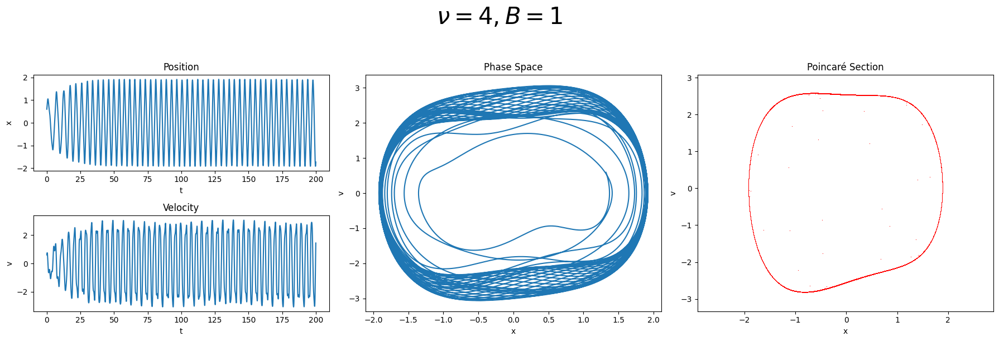

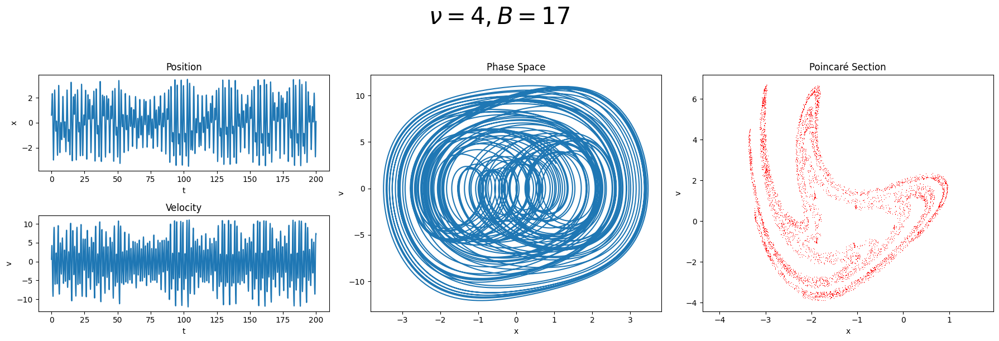

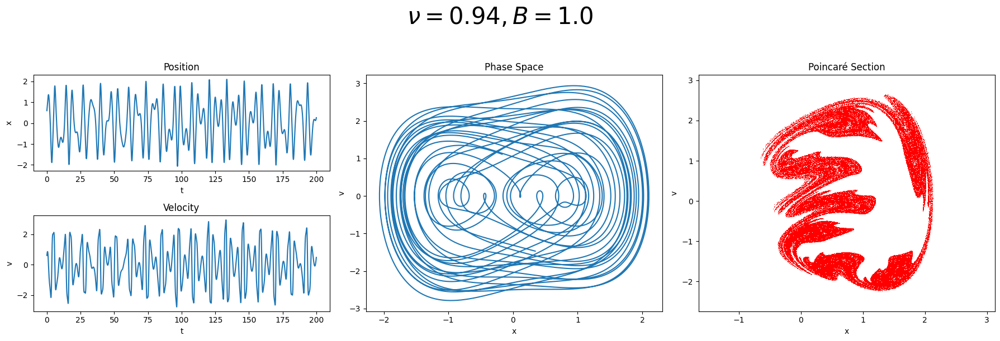

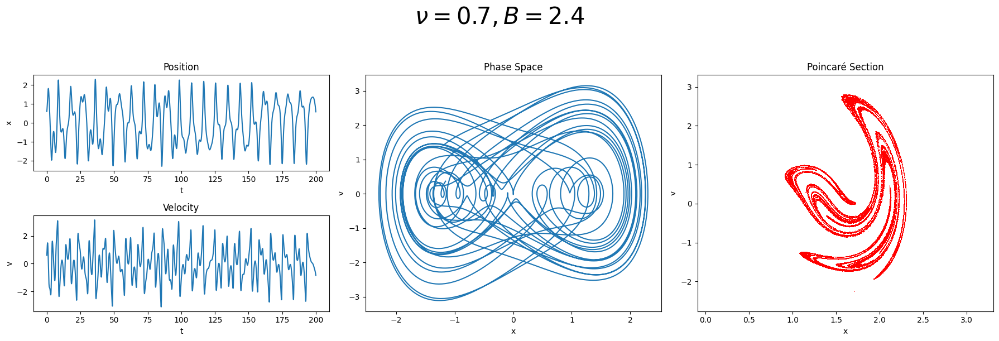

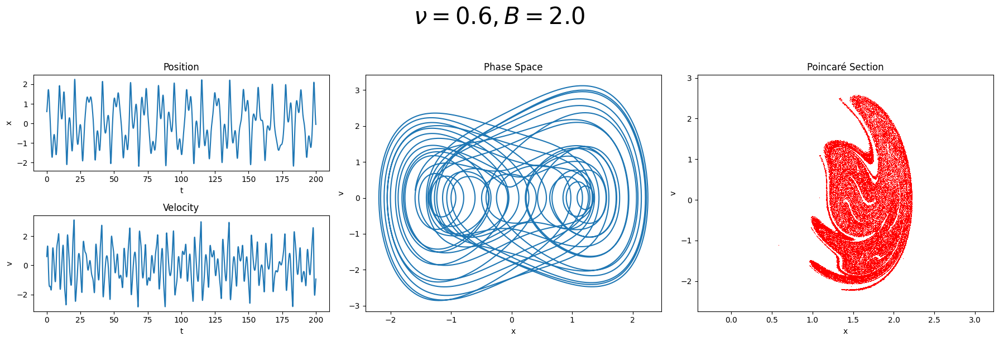

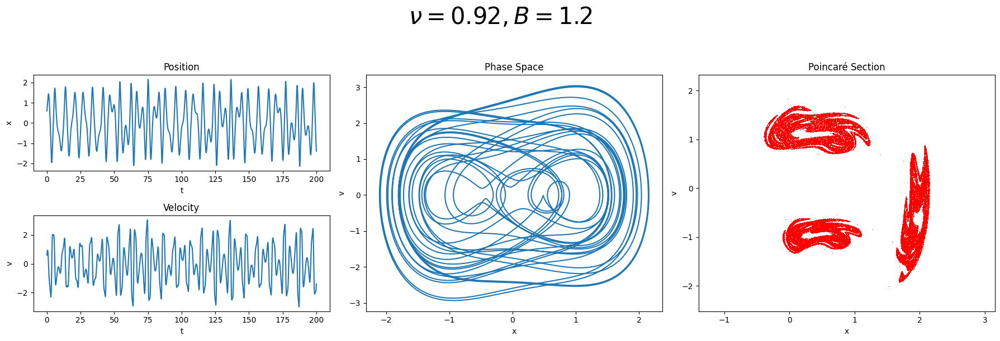

In [28]:
mu     = 0.2       # Damping coefficient
B_vals = [1, 17, 1.00, 2.4, 2.0, 1.20]
k_vals = [4,  4, 0.94, 0.7, 0.6, 0.92]
dt     = 0.01
t_span = [0, 800000]  # Shorter for plotting speed
x0     = [0.6, 0.6]

for idx, (B, k) in enumerate(zip(B_vals, k_vals)):
    t, sol = RK4(ueda_vanderpol, t_span, (mu, k, B), dt, x0)
    x, v = sol[:, 0], sol[:, 1]
    period = 2 * np.pi / k
    ts = np.abs((t % period) - period) < dt

    fig = plt.figure(figsize=(18,6))
    gs=fig.add_gridspec(2,3)
    ax1=fig.add_subplot(gs[0,0])
    ax2=fig.add_subplot(gs[1,0])
    ax3=fig.add_subplot(gs[:,1])
    ax4=fig.add_subplot(gs[:,2])
    fig.suptitle(rf'$ \nu={k}, B={B}$', fontsize=30, y=1.01)
        
    # Time series (x)
    ax1.plot(t[:int(200/dt)], x[:int(200/dt)])
    ax1.set_title(f"Position")
    ax1.set_xlabel("t")
    ax1.set_ylabel("x")

    # Time series (v)
    ax2.plot(t[:int(200/dt)], v[:int(200/dt)])
    ax2.set_title("Velocity")
    ax2.set_xlabel("t")
    ax2.set_ylabel("v")

    # Phase space
    ax3.plot(x[int(7/dt):int(150/dt)], v[int(7/dt):int(150/dt)])
    ax3.set_title("Phase Space")
    ax3.set_xlabel("x")
    ax3.set_ylabel("v")

    # Poincaré section
    ax4.plot(x[ts], v[ts], 'r,', ms=0.4)
    ax4.set_title("Poincaré Section")
    ax4.set_xlabel("x")
    ax4.set_ylabel("v")
    ax4.set_xlim([-1.0+np.min(x[ts]), np.max(x[ts])+1.0])
    ax4.set_ylim([-0.5+np.min(v[ts]), np.max(v[ts])+0.5])
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

### Bifurcation
#### Varying B for fixed $\mu = 0.2, \nu=4$

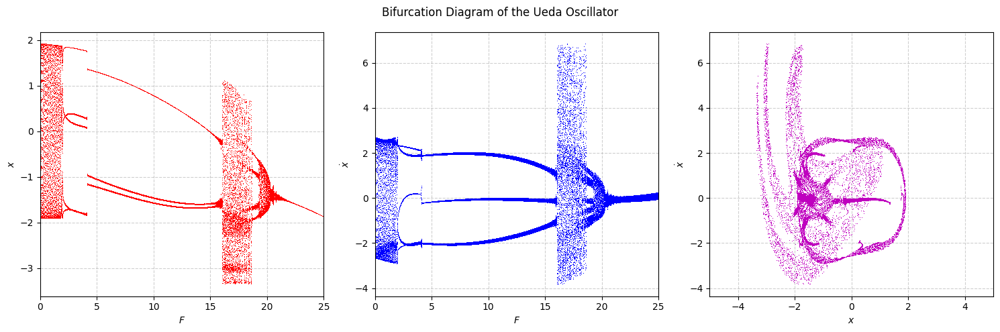

In [29]:
mu     = 0.2
nu     = 4
dt     = 0.01          # Time step
T      = 2 * np.pi / nu
cycles_transient = 100
cycles_sample    = 50
t_span           = [0, (cycles_transient + cycles_sample) * T]
t_all            = np.arange(t_span[0], t_span[1], dt)
sample_times     = np.array([T * (cycles_transient + i) for i in range(cycles_sample)])
sample_indices   = [np.argmin(np.abs(t_all - ts)) for ts in sample_times]
x_samples, v_samples = [], []
intit = [0., 0.]

for B in np.linspace(0., 25., 1000):
    params = (mu, nu, B)
    t, sol = RK4(ueda_vanderpol, t_span, params, dt, intit)
    x, v = sol[:, 0], sol[:, 1]
    x_sampled = x[sample_indices]
    v_sampled = v[sample_indices]
    x_samples.extend([[B, val] for val in x_sampled])
    v_samples.extend([[B, val] for val in v_sampled])
    intit = [sol[-1, 0], sol[-1, 1]]
x_bif = np.array(x_samples)
v_bif = np.array(v_samples)

fig, ax = plt.subplots(1,3, figsize=(15,5))
fig.suptitle('Bifurcation Diagram of the Ueda Oscillator')
ax[0].plot(x_bif[:, 0], x_bif[:, 1], 'r,', ms=0.6)
ax[0].set_xlabel(r'$F$')
ax[0].set_ylabel(r'$x$')
ax[0].grid(True, linestyle='--', alpha=0.6)
ax[0].set_xlim([x_bif[:, 0].min(), x_bif[:, 0].max()])
#ax[0].set_ylim([x_bif[:, 1].min(), x_bif[:, 1].max()])
ax[1].plot(v_bif[:, 0], v_bif[:, 1], 'b,', ms=0.6)
ax[1].set_xlabel(r'$F$')
ax[1].set_ylabel(r'$\dot{x}$')
ax[1].grid(True, linestyle='--', alpha=0.6)
ax[1].set_xlim([v_bif[:, 0].min(), v_bif[:, 0].max()])
#ax[1].set_ylim([v_bif[:, 1].min(), v_bif[:, 1].max()])
ax[2].plot(x_bif[:, 1], v_bif[:, 1], ',m')
ax[2].set_xlabel(r'$x$')
ax[2].set_ylabel(r'$\dot{x}$')
ax[2].grid(True, linestyle='--', alpha=0.6)
ax[2].set_xlim([-10, 10])
ax[2].set_xlim([-5, 5])
plt.tight_layout()
plt.show()

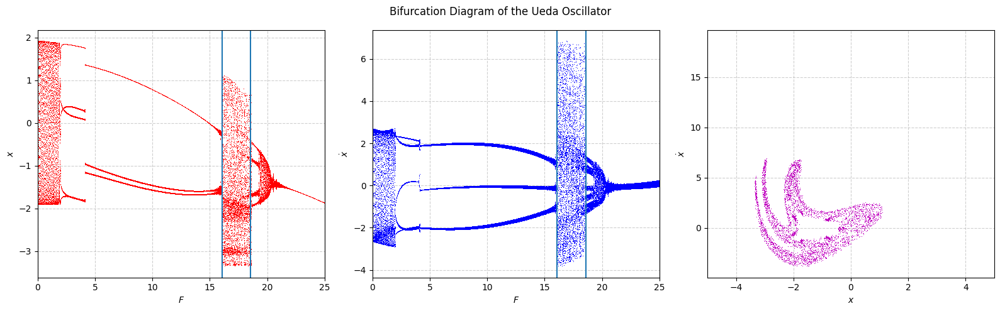

In [30]:
F_x, X = x_bif[:, 0], x_bif[:, 1]
F_v, V = v_bif[:, 0], v_bif[:, 1]
index1 = np.where(np.round(F_x,1)== 16.1)[0][0] # F_x == F_v
index2 = np.where(np.round(F_x,1)== 18.6)[0][0] 

fig, ax = plt.subplots(1,3, figsize=(16,5))
fig.suptitle('Bifurcation Diagram of the Ueda Oscillator')
ax[0].plot(x_bif[:, 0], x_bif[:, 1], 'r,', ms=0.6)
ax[0].axvline(x=F_x[index1])
ax[0].axvline(x=F_x[index2])
ax[0].set_xlabel(r'$F$')
ax[0].set_ylabel(r'$x$')
ax[0].grid(True, linestyle='--', alpha=0.6)
ax[0].set_xlim([x_bif[:, 0].min(), x_bif[:, 0].max()])
#ax[0].set_ylim([x_bif[:, 1].min(), x_bif[:, 1].max()])
ax[1].plot(v_bif[:, 0], v_bif[:, 1], 'b,', ms=0.6)
ax[1].set_xlabel(r'$F$')
ax[1].set_ylabel(r'$\dot{x}$')
ax[1].axvline(x=F_x[index1])
ax[1].axvline(x=F_x[index2])
ax[1].grid(True, linestyle='--', alpha=0.6)
ax[1].set_xlim([v_bif[:, 0].min(), v_bif[:, 0].max()])
#ax[1].set_ylim([v_bif[:, 1].min(), v_bif[:, 1].max()])
ax[2].plot(x_bif[index1:index2], v_bif[index1:index2],',m')
ax[2].set_xlabel(r'$x$')
ax[2].set_ylabel(r'$\dot{x}$')
ax[2].grid(True, linestyle='--', alpha=0.6)
ax[2].set_xlim([-10, 10])
ax[2].set_xlim([-5, 5])
plt.tight_layout()
plt.show()

#### Varying $\mu$ for fixed $B=17, \nu=4$

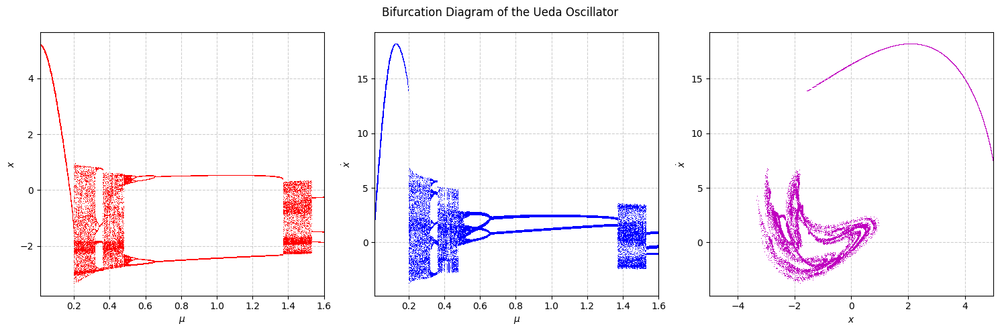

In [18]:
nu     = 4
B      = 17
dt     = 0.01          # Time step
T      = 2 * np.pi / nu
cycles_transient = 100
cycles_sample    = 50
t_span           = [0, (cycles_transient + cycles_sample) * T]
t_all            = np.arange(t_span[0], t_span[1], dt)
sample_times     = np.array([T * (cycles_transient + i) for i in range(cycles_sample)])
sample_indices   = [np.argmin(np.abs(t_all - ts)) for ts in sample_times]
x_samples, v_samples = [], []
intit = [0., 0.]

for mu in np.linspace(0.01, 1.6, 1000):
    params = (mu, nu, B)
    t, sol = RK4(ueda_vanderpol, t_span, params, dt, intit)
    x, v = sol[:, 0], sol[:, 1]
    x_sampled = x[sample_indices]
    v_sampled = v[sample_indices]
    x_samples.extend([[mu, val] for val in x_sampled])
    v_samples.extend([[mu, val] for val in v_sampled])
    intit = [sol[-1, 0], sol[-1, 1]]
x_bif = np.array(x_samples)
v_bif = np.array(v_samples)

fig, ax = plt.subplots(1,3, figsize=(15,5))
fig.suptitle('Bifurcation Diagram of the Ueda Oscillator')
ax[0].plot(x_bif[:, 0], x_bif[:, 1], 'r,', ms=0.6)
ax[0].set_xlabel(r'$\mu$')
ax[0].set_ylabel(r'$x$')
ax[0].grid(True, linestyle='--', alpha=0.6)
ax[0].set_xlim([x_bif[:, 0].min(), x_bif[:, 0].max()])
#ax[0].set_ylim([x_bif[:, 1].min(), x_bif[:, 1].max()])
ax[1].plot(v_bif[:, 0], v_bif[:, 1], 'b,', ms=0.6)
ax[1].set_xlabel(r'$\mu$')
ax[1].set_ylabel(r'$\dot{x}$')
ax[1].grid(True, linestyle='--', alpha=0.6)
ax[1].set_xlim([v_bif[:, 0].min(), v_bif[:, 0].max()])
#ax[1].set_ylim([v_bif[:, 1].min(), v_bif[:, 1].max()])
ax[2].plot(x_bif[:, 1], v_bif[:, 1], ',m')
ax[2].set_xlabel(r'$x$')
ax[2].set_ylabel(r'$\dot{x}$')
ax[2].grid(True, linestyle='--', alpha=0.6)
ax[2].set_xlim([-10, 10])
ax[2].set_xlim([-5, 5])
plt.tight_layout()
plt.show()

#### Varying $\nu$ for fixed $B=1.2, \mu=0.2$

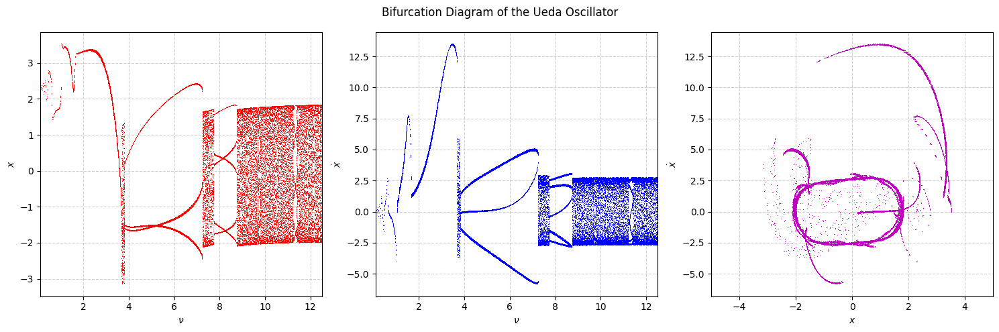

In [11]:
mu     = 0.2
B      = 12
dt     = 0.01          # Time step

cycles_transient = 100
cycles_sample    = 50

x_samples, v_samples = [], []
intit = [0., 0.]

for nu in np.linspace(0.1, 12.5, 1000):
    params = (mu, nu, B)
    T      = 2 * np.pi / nu

    t_span           = [0, (cycles_transient + cycles_sample) * T]
    t_all            = np.arange(t_span[0], t_span[1], dt)
    sample_times     = np.array([T * (cycles_transient + i) for i in range(cycles_sample)])
    sample_indices   = [np.argmin(np.abs(t_all - ts)) for ts in sample_times]

    t, sol = RK4(ueda_vanderpol, t_span, params, dt, intit)
    x, v = sol[:, 0], sol[:, 1]
    x_sampled = x[sample_indices]
    v_sampled = v[sample_indices]
    x_samples.extend([[nu, val] for val in x_sampled])
    v_samples.extend([[nu, val] for val in v_sampled])
    intit = [sol[-1, 0], sol[-1, 1]]
x_bif = np.array(x_samples)
v_bif = np.array(v_samples)

fig, ax = plt.subplots(1,3, figsize=(15,5))
fig.suptitle('Bifurcation Diagram of the Ueda Oscillator')
ax[0].plot(x_bif[:, 0], x_bif[:, 1], 'r,', ms=0.6)
ax[0].set_xlabel(r'$\nu$')
ax[0].set_ylabel(r'$x$')
ax[0].grid(True, linestyle='--', alpha=0.6)
ax[0].set_xlim([x_bif[:, 0].min(), x_bif[:, 0].max()])
#ax[0].set_ylim([x_bif[:, 1].min(), x_bif[:, 1].max()])
ax[1].plot(v_bif[:, 0], v_bif[:, 1], 'b,', ms=0.6)
ax[1].set_xlabel(r'$\nu$')
ax[1].set_ylabel(r'$\dot{x}$')
ax[1].grid(True, linestyle='--', alpha=0.6)
ax[1].set_xlim([v_bif[:, 0].min(), v_bif[:, 0].max()])
#ax[1].set_ylim([v_bif[:, 1].min(), v_bif[:, 1].max()])
ax[2].plot(x_bif[:, 1], v_bif[:, 1], ',m')
ax[2].set_xlabel(r'$x$')
ax[2].set_ylabel(r'$\dot{x}$')
ax[2].grid(True, linestyle='--', alpha=0.6)
ax[2].set_xlim([-10, 10])
ax[2].set_xlim([-5, 5])
plt.tight_layout()
plt.show()

# $$\text{Ueda - Duffing}$$
## $\qquad \ddot{x}+k\dot{x}+x^3=B_0 + B_1\cos t$

Given conditions : $ k=0.05, B_0=\left\{\begin{array}{rl} 0.030  \\ 0.035  \\ 0.045  \end{array} \right. \quad B_1=0.16  $

In [12]:
def ueda_duffing(t, y, const):                         
    k, B0, B1 = const             
    dx_dt = y[1]        
    dv_dt = B0 + B1*np.cos(t) - k*y[1] - y[0]**3    
    return np.array([dx_dt, dv_dt])

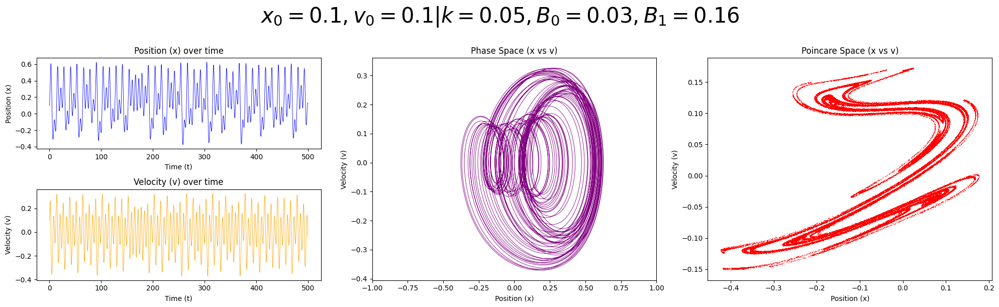

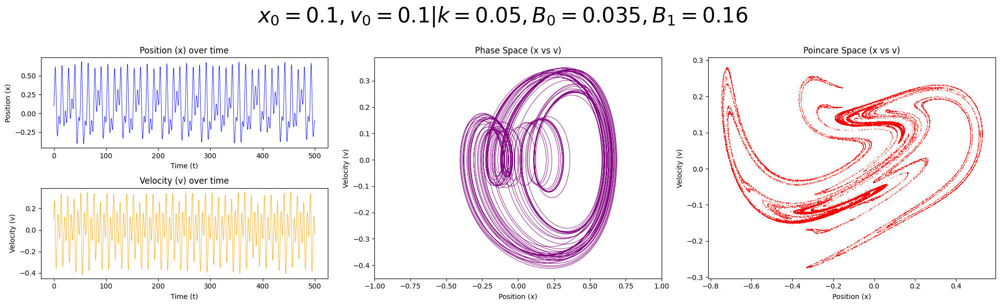

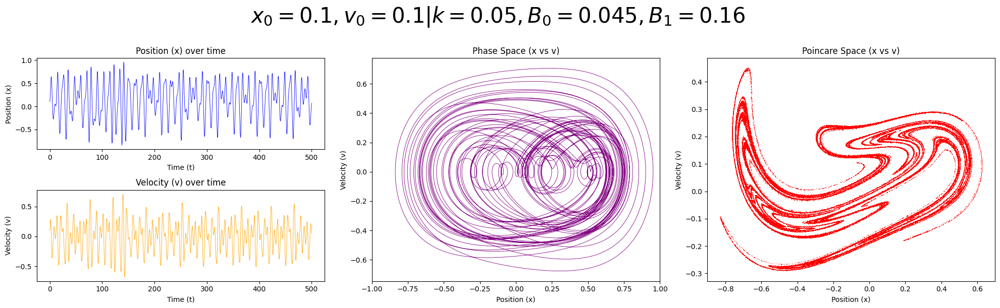

In [33]:
k      = 0.05
B1     = 0.16
x0     = [0.1,0.1]
t_max  = 800000
dt     = 0.01
period = 2 * np.pi / 1

for B0 in [0.03, 0.035, 0.045]:
    t, sol = RK4(ueda_duffing, [0, t_max], (k, B0, B1), dt, x0)
    x, v = sol[:, 0], sol[:, 1]
    ts = np.abs((t % period) - period ) < dt 

    fig = plt.figure(figsize=(20,6))
    gs=fig.add_gridspec(2,3)
    ax1=fig.add_subplot(gs[0,0])
    ax2=fig.add_subplot(gs[1,0])
    ax3=fig.add_subplot(gs[:,1])
    ax4=fig.add_subplot(gs[:,2])
    fig.suptitle(f'$x_0={x[0]}, v_0={v[0]} | k={k}, B_0={B0}, B_1={B1}$', fontsize=30, y=1.01)
        
    ax1.plot(t[:50000], x[:50000], lw=0.6, color='blue')
    ax1.set_title("Position (x) over time")
    ax1.set_xlabel("Time (t)")
    ax1.set_ylabel("Position (x)")
                
    ax2.plot(t[:50000], v[:50000], lw=0.6, color='orange')
    ax2.set_title("Velocity (v) over time")
    ax2.set_xlabel("Time (t)")
    ax2.set_ylabel("Velocity (v)")
        
    ax3.plot(x[:50000], v[:50000], lw=0.6, color='purple')
    ax3.set_title("Phase Space (x vs v)")
    ax3.set_xlabel("Position (x)")
    ax3.set_ylabel("Velocity (v)")
    ax3.set_xlim([-1, 1])
    ax3.set_xlim([-1, 1])
    
    ax4.plot(x[ts], v[ts], 'r,', lw=0.6)
    ax4.set_title("Poincare Space (x vs v)")
    ax4.set_xlabel("Position (x)")
    ax4.set_ylabel("Velocity (v)")
        
    plt.tight_layout()
    plt.show()        

### Bifurcation
#### Varying $B_0$ for fixed $k = 0.05, B_1=0.16$

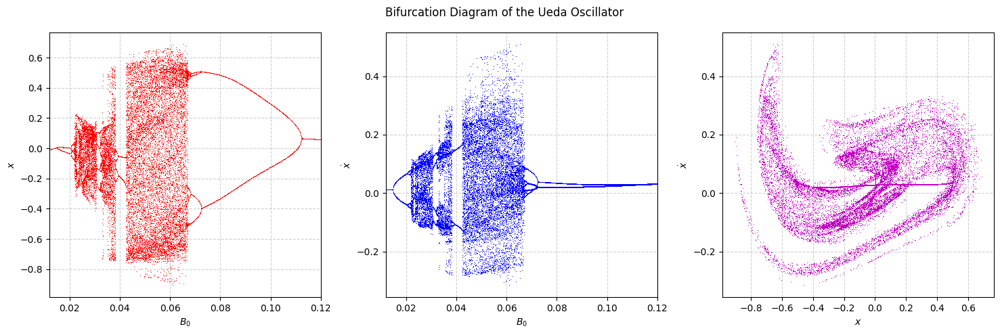

In [19]:
k      = 0.05
B1     = 0.16
dt     = 0.01          # Time step
T      = 2 * np.pi / 1
cycles_transient = 100
cycles_sample    = 50
t_span           = [0, (cycles_transient + cycles_sample) * T]
t_all            = np.arange(t_span[0], t_span[1], dt)
sample_times     = np.array([T * (cycles_transient + i) for i in range(cycles_sample)])
sample_indices   = [np.argmin(np.abs(t_all - ts)) for ts in sample_times]
x_samples, v_samples = [], []
intit = [0.1, 0.1]

for B0 in np.linspace(0.012, 0.12, 1000):
    params = (k, B0, B1)
    t, sol = RK4(ueda_duffing, t_span, params, dt, intit)
    x, v = sol[:, 0], sol[:, 1]
    x_sampled = x[sample_indices]
    v_sampled = v[sample_indices]
    x_samples.extend([[B0, val] for val in x_sampled])
    v_samples.extend([[B0, val] for val in v_sampled])
    intit = [sol[-1, 0], sol[-1, 1]]
x_bif = np.array(x_samples)
v_bif = np.array(v_samples)

fig, ax = plt.subplots(1,3, figsize=(15,5))
fig.suptitle('Bifurcation Diagram of the Ueda Oscillator')
ax[0].plot(x_bif[:, 0], x_bif[:, 1], 'r,', ms=0.6)
ax[0].set_xlabel(r'$B_0$')
ax[0].set_ylabel(r'$x$')
ax[0].grid(True, linestyle='--', alpha=0.6)
ax[0].set_xlim([x_bif[:, 0].min(), x_bif[:, 0].max()])
#ax[0].set_ylim([x_bif[:, 1].min(), x_bif[:, 1].max()])
ax[1].plot(v_bif[:, 0], v_bif[:, 1], 'b,', ms=0.6)
ax[1].set_xlabel(r'$B_0$')
ax[1].set_ylabel(r'$\dot{x}$')
ax[1].grid(True, linestyle='--', alpha=0.6)
ax[1].set_xlim([v_bif[:, 0].min(), v_bif[:, 0].max()])
#ax[1].set_ylim([v_bif[:, 1].min(), v_bif[:, 1].max()])
ax[2].plot(x_bif[:, 1], v_bif[:, 1], ',m')
ax[2].set_xlabel(r'$x$')
ax[2].set_ylabel(r'$\dot{x}$')
ax[2].grid(True, linestyle='--', alpha=0.6)
#ax[2].set_xlim([-10, 10])
#ax[2].set_xlim([-5, 5])
plt.tight_layout()
plt.show()

#### Varying $B_1$ for fixed $k = 0.05, B_0=0.045$

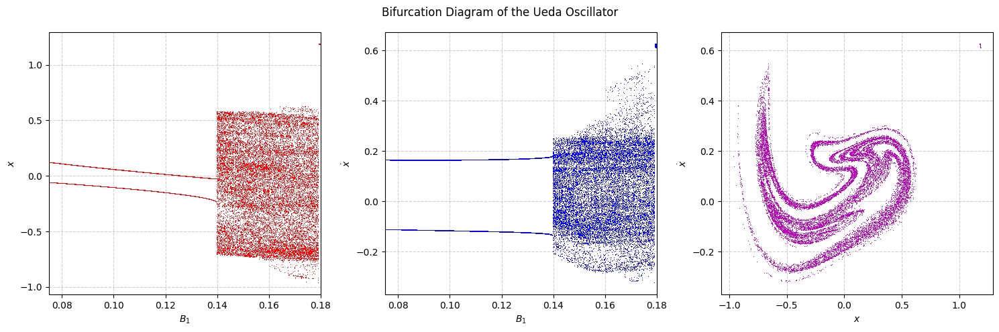

In [14]:
k      = 0.05
B0     = 0.045
dt     = 0.01          # Time step
T      = 2 * np.pi / 1
cycles_transient = 100
cycles_sample    = 50
t_span           = [0, (cycles_transient + cycles_sample) * T]
t_all            = np.arange(t_span[0], t_span[1], dt)
sample_times     = np.array([T * (cycles_transient + i) for i in range(cycles_sample)])
sample_indices   = [np.argmin(np.abs(t_all - ts)) for ts in sample_times]
x_samples, v_samples = [], []
intit = [0.1, 0.1]

for B1 in np.linspace(0.075, 0.18, 1000):
    params = (k, B0, B1)
    t, sol = RK4(ueda_duffing, t_span, params, dt, intit)
    x, v = sol[:, 0], sol[:, 1]
    x_sampled = x[sample_indices]
    v_sampled = v[sample_indices]
    x_samples.extend([[B1, val] for val in x_sampled])
    v_samples.extend([[B1, val] for val in v_sampled])
    intit = [sol[-1, 0], sol[-1, 1]]
x_bif = np.array(x_samples)
v_bif = np.array(v_samples)

fig, ax = plt.subplots(1,3, figsize=(15,5))
fig.suptitle('Bifurcation Diagram of the Ueda Oscillator')
ax[0].plot(x_bif[:, 0], x_bif[:, 1], 'r,', ms=0.6)
ax[0].set_xlabel(r'$B_1$')
ax[0].set_ylabel(r'$x$')
ax[0].grid(True, linestyle='--', alpha=0.6)
ax[0].set_xlim([x_bif[:, 0].min(), x_bif[:, 0].max()])
#ax[0].set_ylim([x_bif[:, 1].min(), x_bif[:, 1].max()])
ax[1].plot(v_bif[:, 0], v_bif[:, 1], 'b,', ms=0.6)
ax[1].set_xlabel(r'$B_1$')
ax[1].set_ylabel(r'$\dot{x}$')
ax[1].grid(True, linestyle='--', alpha=0.6)
ax[1].set_xlim([v_bif[:, 0].min(), v_bif[:, 0].max()])
#ax[1].set_ylim([v_bif[:, 1].min(), v_bif[:, 1].max()])
ax[2].plot(x_bif[:, 1], v_bif[:, 1], ',m')
ax[2].set_xlabel(r'$x$')
ax[2].set_ylabel(r'$\dot{x}$')
ax[2].grid(True, linestyle='--', alpha=0.6)
#ax[2].set_xlim([-10, 10])
#ax[2].set_xlim([-5, 5])
plt.tight_layout()
plt.show()